## <img src="./logo_UTN.svg" align="right" width="150" /> 
#### Procesamiento Digital de Señales

# Trabajo Práctico 3
#### Nombre y Apellido: Nicolás Ferragamo

***
## Estimación espectral


In [2]:
## Inicialización del Notebook del TP3

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.signal as sg
from scipy.fftpack import fft
from pandas import DataFrame
from IPython.display import HTML
from pdsmodulos.signals import windows as wds
from pdsmodulos.signals import spectral_estimation as sp

# Módulos para Jupyter
import warnings
warnings.filterwarnings('ignore')

#%%  Inicialización de librerías
# Setup inline graphics: Esto lo hacemos para que el tamaño de la salida, 
# sea un poco más adecuada al tamaño del documento
mpl.rcParams['figure.figsize'] = (10,10)

fs = 1000 # Hz

# Insertar aquí el código para inicializar tu notebook
########################################################


<div class="alert alert-block alert-info">
<b>1)</b> Compruebe experimentalmente las propiedades de sesgo y varianza del periodograma.
</div>

<div class="alert alert-block alert-success">
<b>Ayuda:</b> Puede utilizar una señal aleatoria con valores normalmente distribuidos de media nula y varianza **NO** unitaria, es decir $ x \sim \mathcal{N}(\mu=0,\sigma^2=2)$

</div>

Es decir, que el periodograma es un estimador de la densidad de potencia espectral (Ver Hayes 8.2.2):

$$ \hat{P_P}(e^{\frac{2\pi·k·f_S}{N}}) = \hat{P_P}(k) = \frac{1}{N}· \lvert X(k) \rvert ^2  $$

 + **no sesgado asintóticamente** a medida que aumenta la ventana de registro N.
 + tiene varianza constante y **NO** depende de N.

Voy a comenzar generando las señales aleatorias pedidas para utilizar las mismas en cada punto de forma de poder comparar cada estimador utilizando las mismas señales de entrada.

<IPython.core.display.Javascript object>


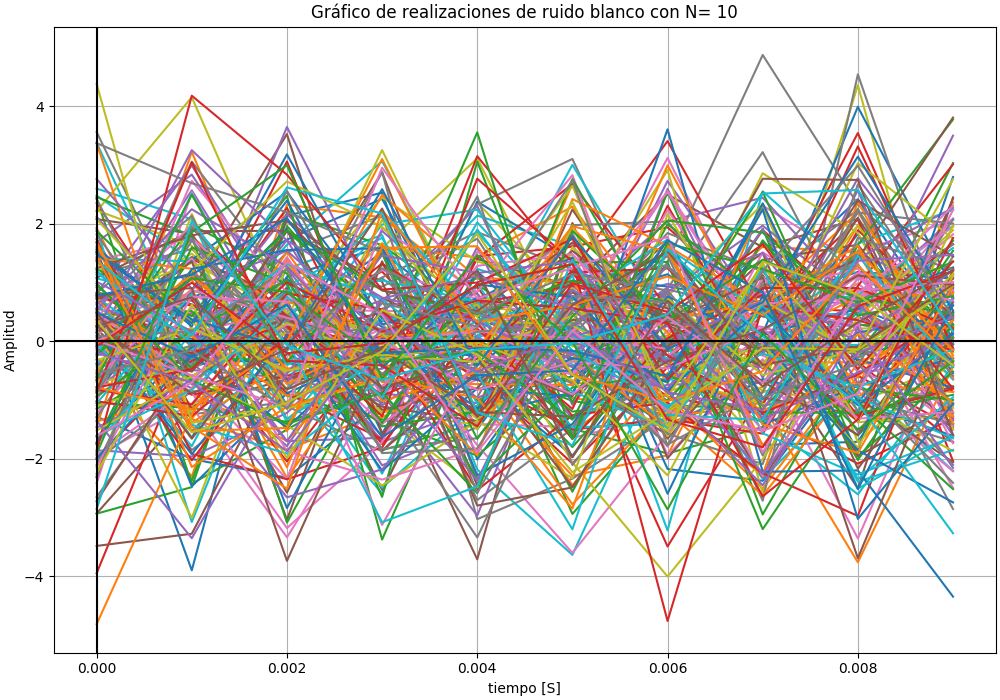

<IPython.core.display.Javascript object>


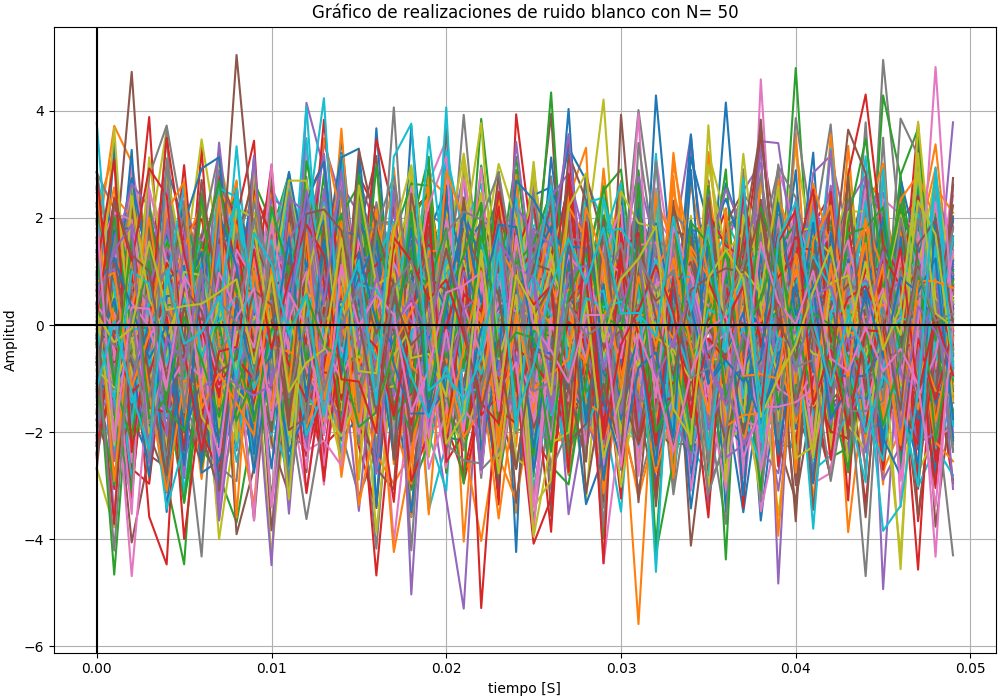

<IPython.core.display.Javascript object>


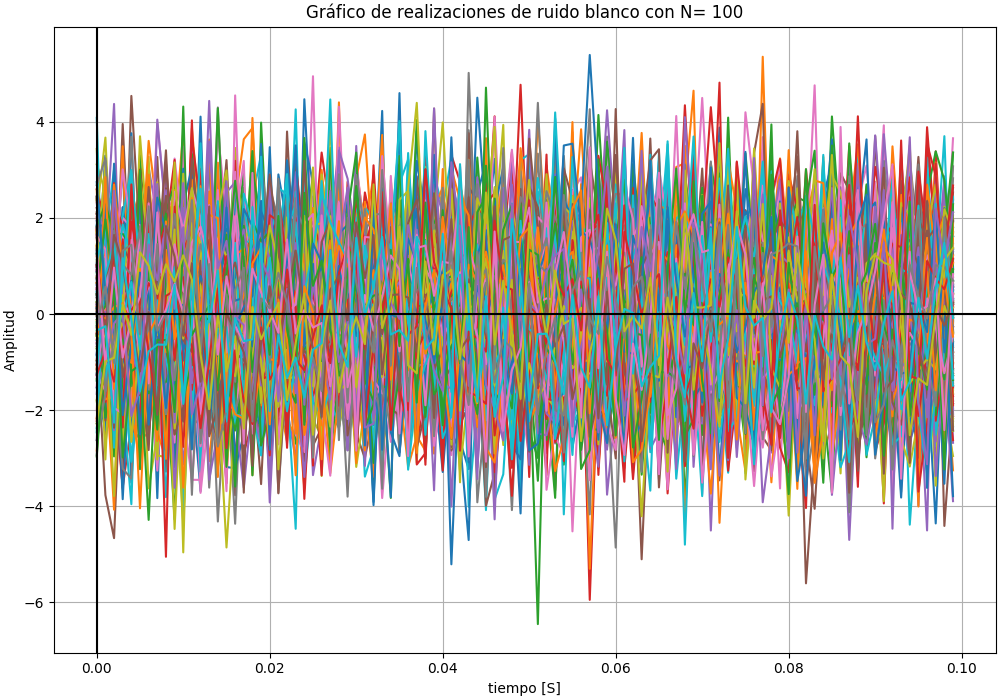

<IPython.core.display.Javascript object>


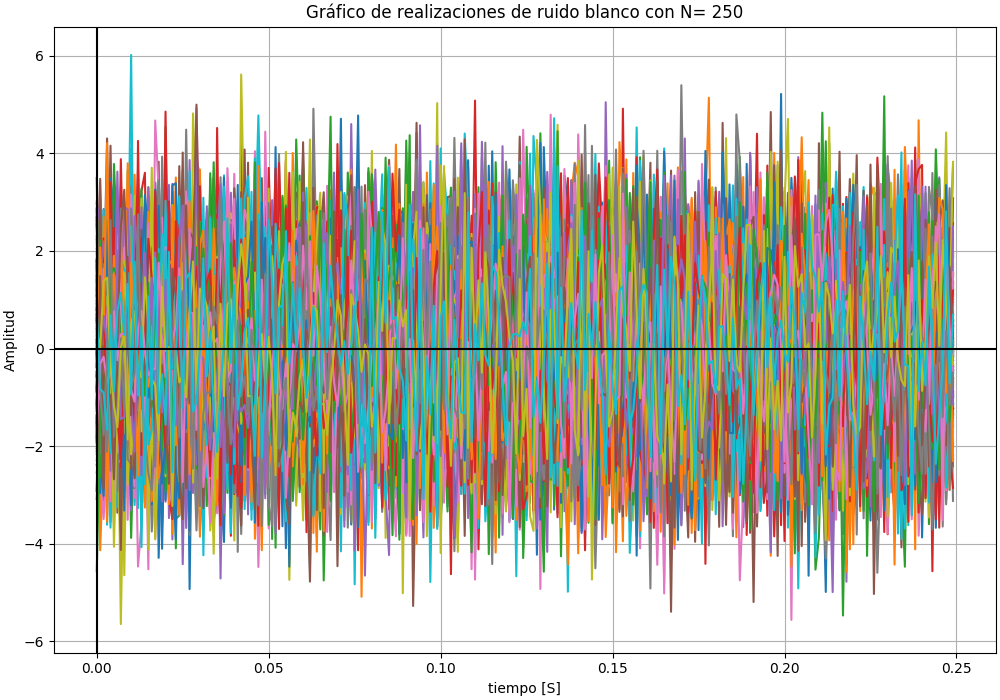

<IPython.core.display.Javascript object>


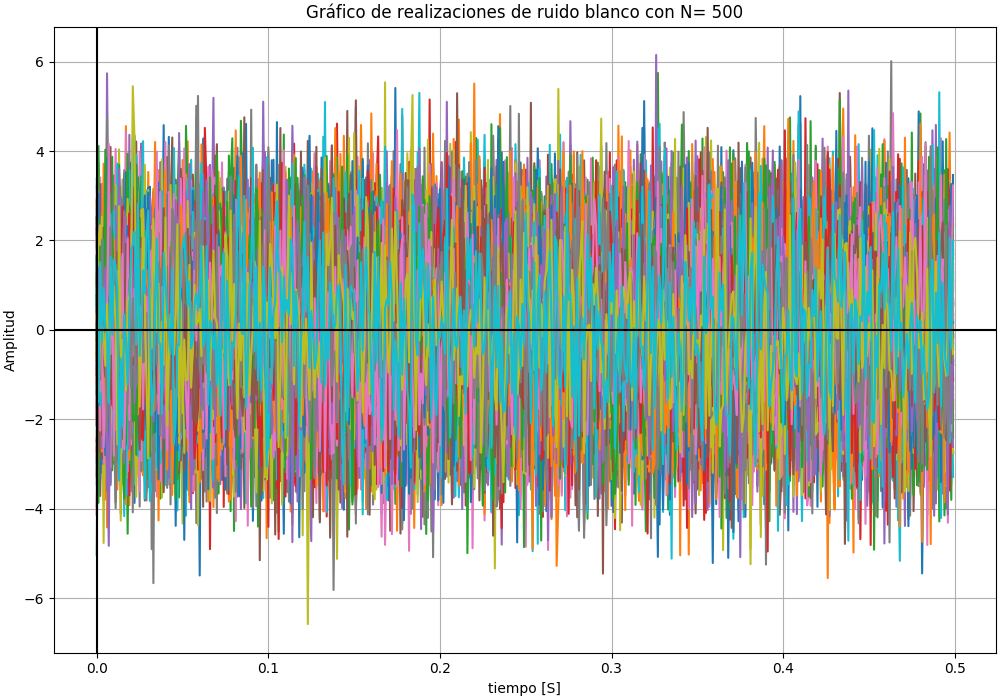

<IPython.core.display.Javascript object>


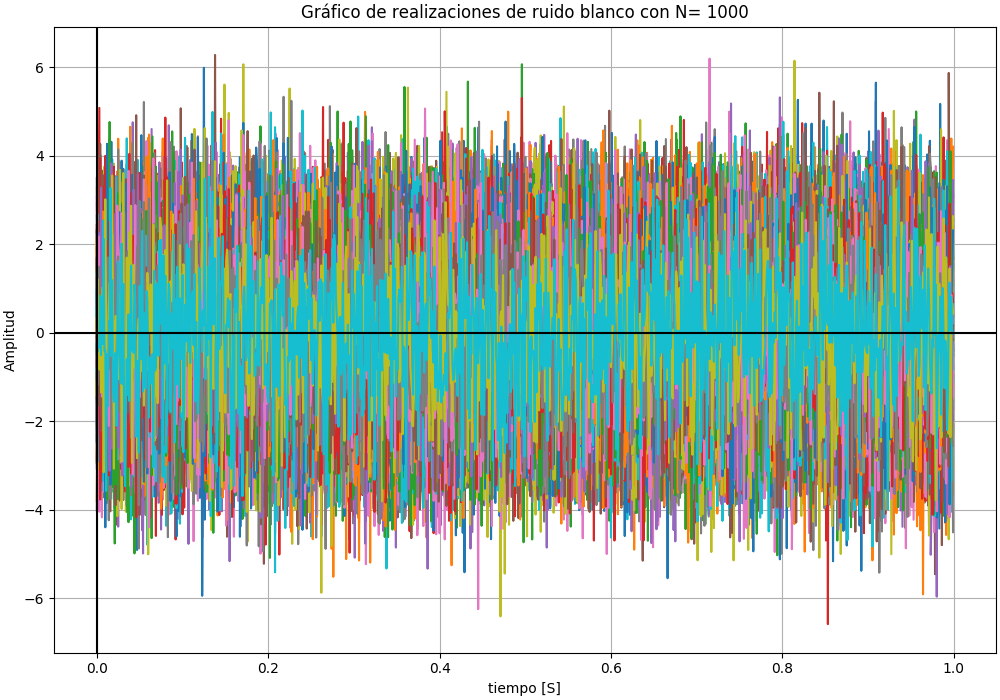

In [36]:
%matplotlib notebook
mpl.rcParams['figure.figsize'] = (10,7)

N = np.array([10, 50, 100, 250, 500, 1000, 5000], dtype=np.int)
fs = 1000 # Hz
Nexp = 200
mu = 0    # media (mu)
var = 2 # varianza

N = np.array([10, 50, 100, 250, 500, 1000, 5000], dtype=np.int)
fs = 1000 # Hz
Nexp = 200
mu = 0    # media (mu)
var = 2 # varianza

#%% generación de señales    
signal0 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[0])  for j in range(Nexp)]))
signal1 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[1])  for j in range(Nexp)]))
signal2 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[2])  for j in range(Nexp)]))
signal3 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[3])  for j in range(Nexp)]))
signal4 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[4])  for j in range(Nexp)]))
signal5 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[5])  for j in range(Nexp)]))
signal6 = np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N[6])  for j in range(Nexp)]))


#%%  Grafico 
A = ["10", "50", "100", "250", "500", "1000", "5000"]
## ejes de tiempo
tt0 = np.linspace(0, (N[0]-1)/fs, N[0])  
tt1 = np.linspace(0, (N[1]-1)/fs, N[1]) 
tt2 = np.linspace(0, (N[2]-1)/fs, N[2])
tt3 = np.linspace(0, (N[3]-1)/fs, N[3]) 
tt4 = np.linspace(0, (N[4]-1)/fs, N[4]) 
tt5 = np.linspace(0, (N[5]-1)/fs, N[5]) 
tt6 = np.linspace(0, (N[6]-1)/fs, N[6]) 


#%%  Grafico de los resultados de N=10
plt.figure("Gráfico de realizaciones de ruido blanco con N= " + A[0], constrained_layout=True)
plt.title("Gráfico de realizaciones de ruido blanco con N= " + A[0])
plt.plot(tt0,signal0)
plt.xlabel("tiempo [S]")
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

#%%  Grafico de los resultados de N=50
plt.figure("Gráfico de realizaciones de ruido blanco con N= " + A[1], constrained_layout=True)
plt.title("Gráfico de realizaciones de ruido blanco con N= " + A[1])
plt.plot(tt1,signal1)
plt.xlabel("tiempo [S]")
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

#%%  Grafico de los resultados de N=100
plt.figure("Gráfico de realizaciones de ruido blanco con N= " + A[2], constrained_layout=True)
plt.title("Gráfico de realizaciones de ruido blanco con N= " + A[2])
plt.plot(tt2,signal2)
plt.xlabel("tiempo [S]")
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

#%%  Grafico de los resultados de N=250
plt.figure("Gráfico de realizaciones de ruido blanco con N= " + A[3], constrained_layout=True)
plt.title("Gráfico de realizaciones de ruido blanco con N= " + A[3])
plt.plot(tt3,signal3)
plt.xlabel("tiempo [S]")
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

#%%  Grafico de los resultados de N=500
plt.figure("Gráfico de realizaciones de ruido blanco con N= " + A[4], constrained_layout=True)
plt.title("Gráfico de realizaciones de ruido blanco con N= " + A[4])
plt.plot(tt4,signal4)
plt.xlabel("tiempo [S]")
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

#%%  Grafico de los resultados de N=1000
plt.figure("Gráfico de realizaciones de ruido blanco con N= " + A[5], constrained_layout=True)
plt.title("Gráfico de realizaciones de ruido blanco con N= " + A[5])
plt.plot(tt5,signal5)
plt.xlabel("tiempo [S]")
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()



<IPython.core.display.Javascript object>


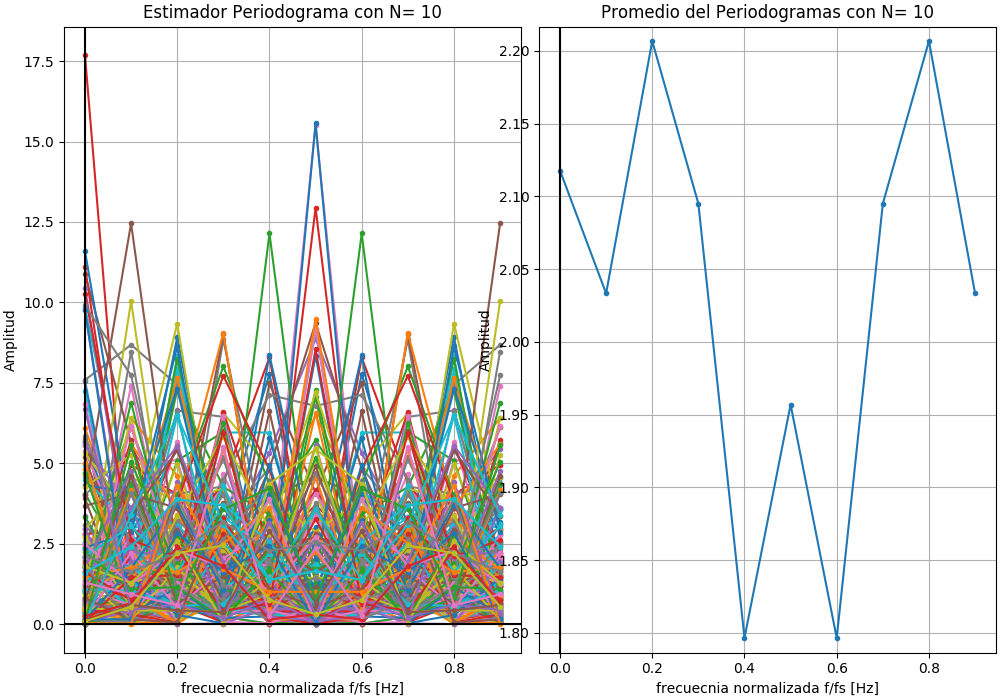

<IPython.core.display.Javascript object>


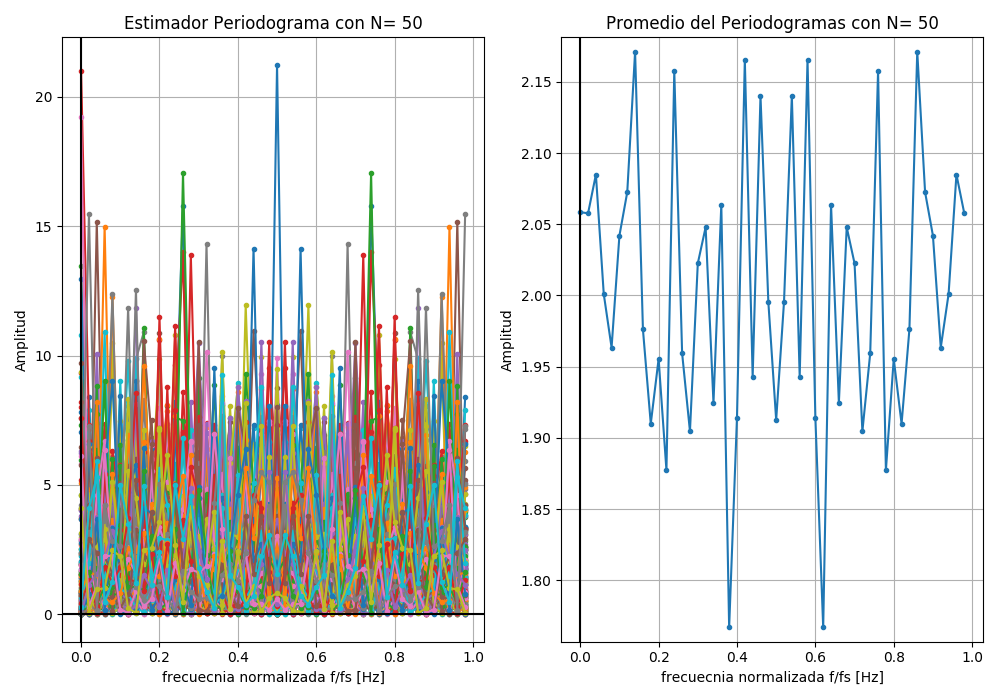

<IPython.core.display.Javascript object>


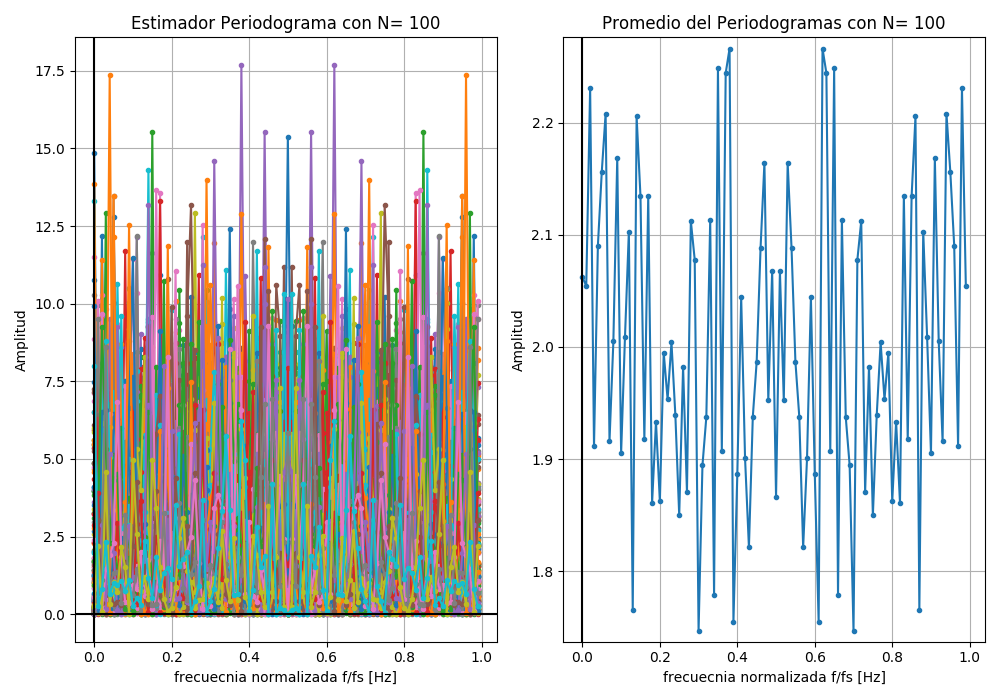

<IPython.core.display.Javascript object>


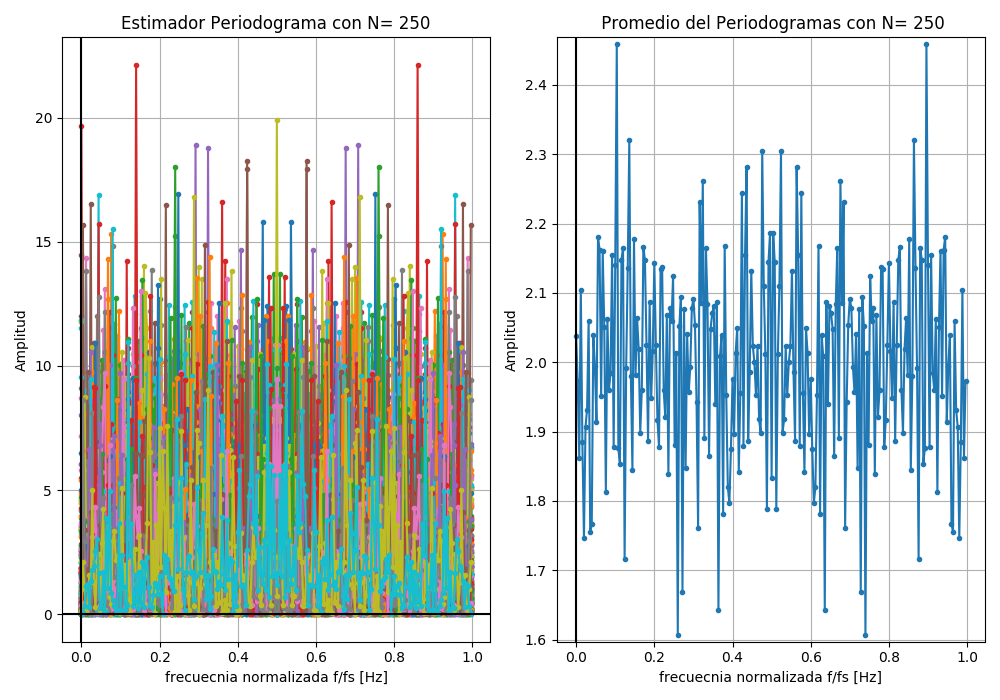

<IPython.core.display.Javascript object>


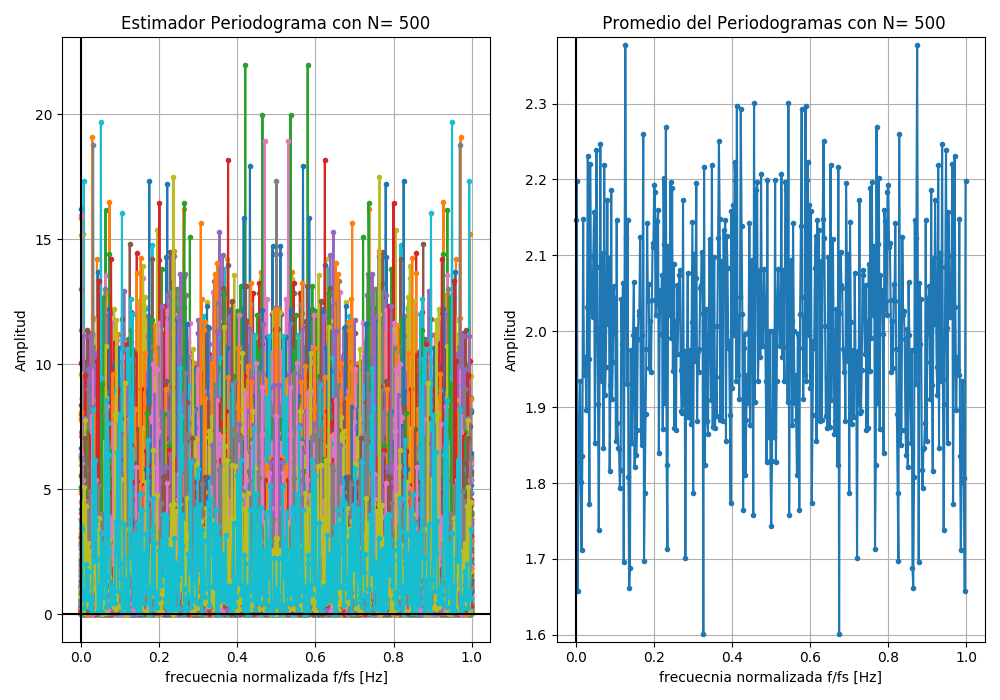

<IPython.core.display.Javascript object>


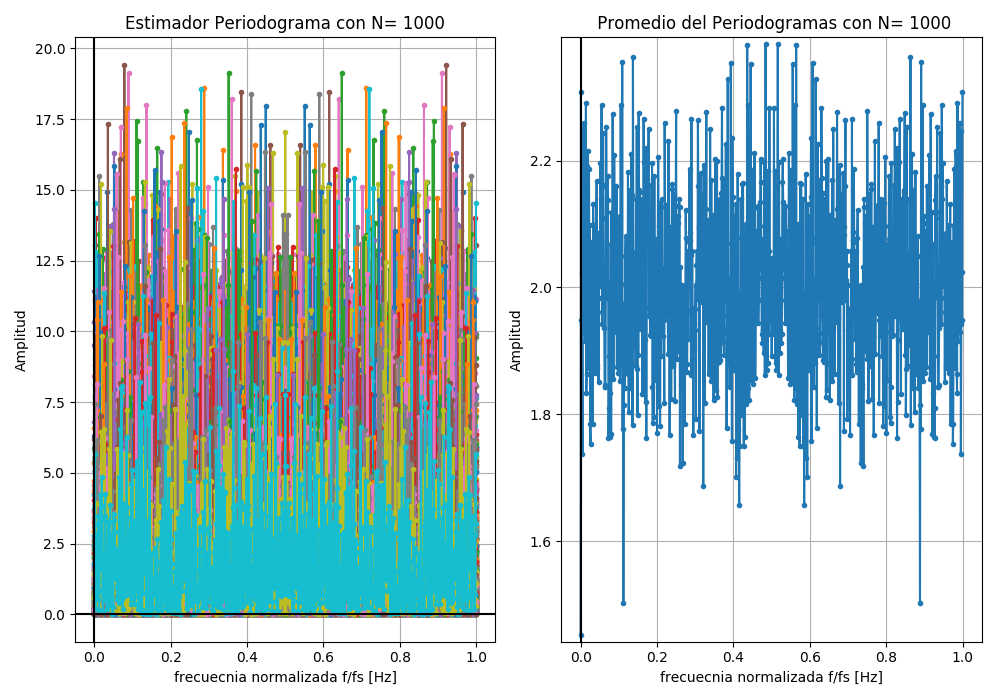

<IPython.core.display.Javascript object>


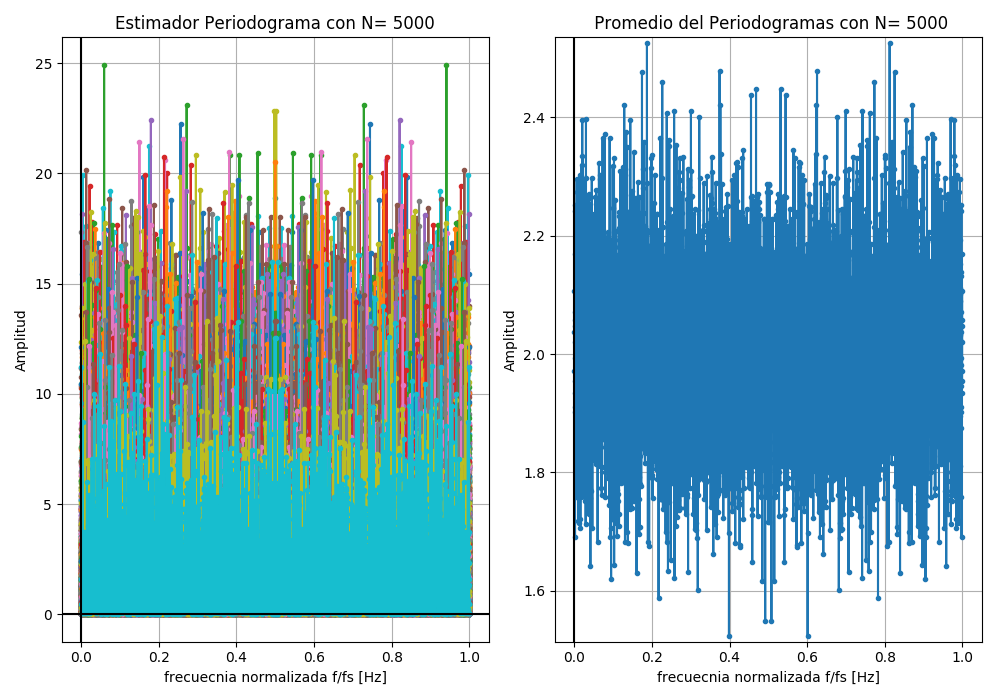

<IPython.core.display.Javascript object>


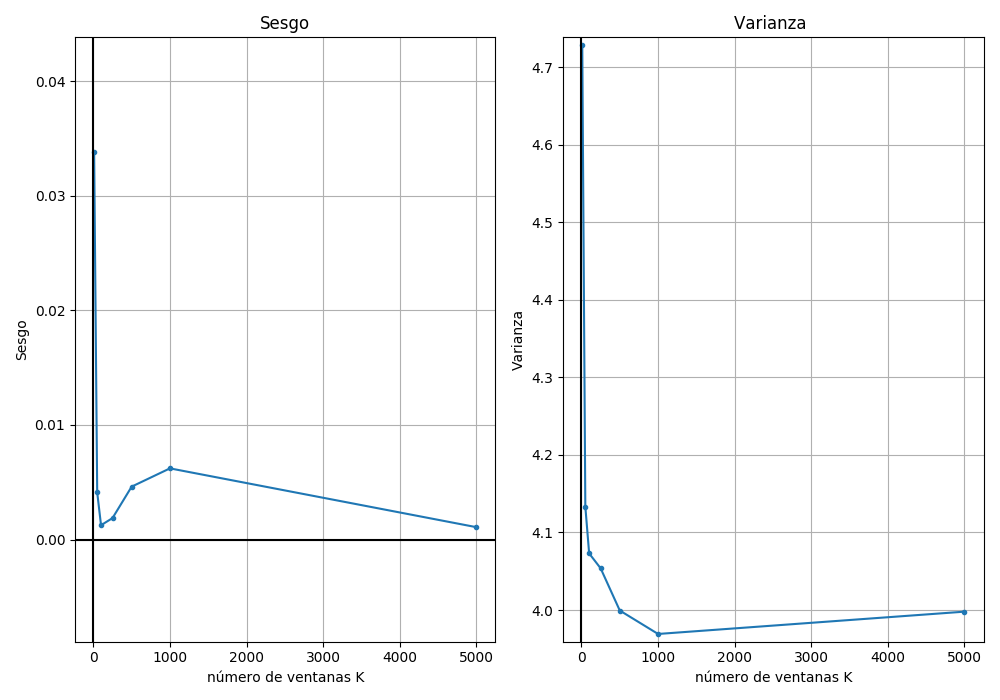

In [37]:
%matplotlib notebook
mpl.rcParams['figure.figsize'] = (10,7)

#%% Periodograma
Sper0  = sp.periodogram(signal0, exp=Nexp, ax=0)
Sper1  = sp.periodogram(signal1, exp=Nexp, ax=0)
Sper2  = sp.periodogram(signal2, exp=Nexp, ax=0)
Sper3  = sp.periodogram(signal3, exp=Nexp, ax=0)
Sper4  = sp.periodogram(signal4, exp=Nexp, ax=0)
Sper5  = sp.periodogram(signal5, exp=Nexp, ax=0)
Sper6  = sp.periodogram(signal6, exp=Nexp, ax=0)

#%% Cálculo de la energía 
energia0 = np.sum(Sper0, axis=0) / N[0]
energia1 = np.sum(Sper1, axis=0) / N[1]
energia2 = np.sum(Sper2, axis=0) / N[2]
energia3 = np.sum(Sper3, axis=0) / N[3]
energia4 = np.sum(Sper4, axis=0) / N[4]
energia5 = np.sum(Sper5, axis=0) / N[5]
energia6 = np.sum(Sper6, axis=0) / N[6]

#%% Valor medio muestreal
valor_medio_muestreal0 = np.mean(Sper0, axis=1) 
valor_medio_muestreal1 = np.mean(Sper1, axis=1) 
valor_medio_muestreal2 = np.mean(Sper2, axis=1) 
valor_medio_muestreal3 = np.mean(Sper3, axis=1) 
valor_medio_muestreal4 = np.mean(Sper4, axis=1) 
valor_medio_muestreal5 = np.mean(Sper5, axis=1) 
valor_medio_muestreal6 = np.mean(Sper6, axis=1) 

#%% valor medio
valor_medio0 = np.mean(valor_medio_muestreal0, axis=0) 
valor_medio1 = np.mean(valor_medio_muestreal1, axis=0) 
valor_medio2 = np.mean(valor_medio_muestreal2, axis=0) 
valor_medio3 = np.mean(valor_medio_muestreal3, axis=0) 
valor_medio4 = np.mean(valor_medio_muestreal4, axis=0) 
valor_medio5 = np.mean(valor_medio_muestreal5, axis=0) 
valor_medio6 = np.mean(valor_medio_muestreal6, axis=0) 

#%% sesgo 
sesgo0 = np.abs(valor_medio0 - var)
sesgo1 = np.abs(valor_medio1 - var)
sesgo2 = np.abs(valor_medio2 - var)
sesgo3 = np.abs(valor_medio3 - var)
sesgo4 = np.abs(valor_medio4 - var)
sesgo5 = np.abs(valor_medio5 - var)
sesgo6 = np.abs(valor_medio6 - var)

#%% valor muestreal
var_muestreal0 = np.var(Sper0, axis=1) 
var_muestreal1 = np.var(Sper1, axis=1) 
var_muestreal2 = np.var(Sper2, axis=1) 
var_muestreal3 = np.var(Sper3, axis=1) 
var_muestreal4 = np.var(Sper4, axis=1) 
var_muestreal5 = np.var(Sper5, axis=1) 
var_muestreal6 = np.var(Sper6, axis=1) 

#%% Varianza
varianza0 =  np.mean(var_muestreal0, axis=0)
varianza1 =  np.mean(var_muestreal1, axis=0)
varianza2 =  np.mean(var_muestreal2, axis=0)
varianza3 =  np.mean(var_muestreal3, axis=0)
varianza4 =  np.mean(var_muestreal4, axis=0)
varianza5 =  np.mean(var_muestreal5, axis=0)
varianza6 =  np.mean(var_muestreal6, axis=0)


#%%  Grafico 
A = ["10", "50", "100", "250", "500", "1000", "5000"]

ff0 = np.linspace(0,(N[0]-1)*fs/N[0], N[0])/fs
ff1 = np.linspace(0,(N[1]-1)*fs/N[1], N[1])/fs
ff2 = np.linspace(0,(N[2]-1)*fs/N[2], N[2])/fs
ff3 = np.linspace(0,(N[3]-1)*fs/N[3], N[3])/fs
ff4 = np.linspace(0,(N[4]-1)*fs/N[4], N[4])/fs
ff5 = np.linspace(0,(N[5]-1)*fs/N[5], N[5])/fs
ff6 = np.linspace(0,(N[6]-1)*fs/N[6], N[6])/fs


#%%  Grafico de los resultados de N=10
plt.figure("Periodogramas de ruido blanco con N= " + A[0], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[0])
plt.plot(ff0, Sper0, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[0], constrained_layout=True)
plt.title("Promedio del Periodogramas con N= " + A[0])
plt.plot(ff0, valor_medio_muestreal0, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal0)-0.01, max(valor_medio_muestreal0)+0.01)
plt.grid()


#%%  Grafico de los resultados de N=50
plt.figure("Periodogramas de ruido blanco con N= " + A[1], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[1])
plt.plot(ff1, Sper1, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[1], constrained_layout=True)
plt.title("Promedio del Periodogramas con N= " + A[1])
plt.plot(ff1, valor_medio_muestreal1, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal1)-0.01, max(valor_medio_muestreal1)+0.01)
plt.grid()
plt.tight_layout()


#%%  Grafico de los resultados de N=100
plt.figure("Periodogramas de ruido blanco con N= " + A[2], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[2])
plt.plot(ff2, Sper2, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[2], constrained_layout=True)
plt.title("Promedio del Periodogramas con N= " + A[2])
plt.plot(ff2, valor_medio_muestreal2, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal2)-0.01, max(valor_medio_muestreal2)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de N=250
plt.figure("Periodogramas de ruido blanco con N= " + A[3], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[3])
plt.plot(ff3, Sper3, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[3], constrained_layout=True)
plt.title(" Promedio del Periodogramas con N= " + A[3])
plt.plot(ff3, valor_medio_muestreal3, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal3)-0.01, max(valor_medio_muestreal3)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de N=500
plt.figure("Periodogramas de ruido blanco con N= " + A[4], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[4])
plt.plot(ff4, Sper4, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[4], constrained_layout=True)
plt.title(" Promedio del Periodogramas con N= " + A[4])
plt.plot(ff4, valor_medio_muestreal4, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal4)-0.01, max(valor_medio_muestreal4)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de N=1000
plt.figure("Periodogramas de ruido blanco con N= " + A[5], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[5])
plt.plot(ff5, Sper5, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[5], constrained_layout=True)
plt.title(" Promedio del Periodogramas con N= " + A[5])
plt.plot(ff5, valor_medio_muestreal5, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal5)-0.01, max(valor_medio_muestreal5)+0.01)
plt.grid()
plt.tight_layout()


#%%  Grafico de los resultados de N=5000
plt.figure("Periodogramas de ruido blanco con N= " + A[6], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador Periodograma con N= " + A[6])
plt.plot(ff6, Sper6, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con n°= " + A[6], constrained_layout=True)
plt.title(" Promedio del Periodogramas con N= " + A[6])
plt.plot(ff6, valor_medio_muestreal6, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal6)-0.01, max(valor_medio_muestreal6)+0.01)
plt.grid()
plt.tight_layout()

#%% Gráfico de la varianza
varianza = [varianza0, varianza1, varianza2, varianza3, varianza4, varianza5, varianza6]
sesgo =[sesgo0, sesgo1, sesgo2, sesgo3, sesgo4, sesgo5, sesgo6]

plt.figure("Consistencia del estimador", constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Sesgo")
plt.plot(N, sesgo, marker='.')
plt.xlabel('número de ventanas K')
plt.ylabel("Sesgo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(sesgo)-0.01, max(sesgo)+0.01)
plt.grid()

plt.subplot(1,2,2)
plt.title("Varianza ")
plt.plot(N, varianza, marker='.')
plt.xlabel('número de ventanas K')
plt.ylabel("Varianza")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(varianza)-0.01, max(varianza)+0.01)
plt.grid()
plt.tight_layout()


In [38]:

#######################################
# Tu simulación que genere resultados #
#######################################

tus_resultados_per = [ 
                   [sesgo0, varianza0], # <-- acá debería haber numeritos :)
                   [sesgo1, varianza1], # <-- acá debería haber numeritos :)
                   [sesgo2, varianza2], # <-- acá debería haber numeritos :)
                   [sesgo3, varianza3], # <-- acá debería haber numeritos :)
                   [sesgo4, varianza4], # <-- acá debería haber numeritos :)
                   [sesgo5, varianza5], # <-- acá debería haber numeritos :)
                   [sesgo6, varianza6], # <-- acá debería haber numeritos :)
                 ]
df = DataFrame(tus_resultados_per, columns=['$s_P$', '$v_P$'],
               index=N)
HTML(df.to_html())


,$s_P$,$v_P$
10,0.033832,4.728304
50,0.004115,4.133350
100,0.001250,4.072958
250,0.001872,4.053751
500,0.004617,3.999334
1000,0.006211,3.969119
5000,0.001081,3.997873


<div class="alert alert-block alert-warning">
<b>Respuesta:</b> De la bibliografía sabemos que el valor esperado del periodograma para ruido blanco Gaussiano es  $ E \{\hat{P_P}(e^{\frac{2\pi·k·f_S}{N}})\} = \sigma^2$. Podemos contemplar esto en la tabla anterior, a mayor número de muestras el valor esperado se a cerca al valor de la varianza. Por otra lado podemos notar que la varianza para todas las muestras es similar y tiene el valor esperado de $\sigma^4$. Con esta información podemos demostrar lo planteado en la premisa y en la bibliografía. Como consecuencia podemos afirmar que el <b>Periodograma</b> no es un estimador consistente de la <b>PSD</b>.
</div>

<div class="alert alert-block alert-info">
<b>2)</b>     Compruebe del mismo modo los resultados de sesgo y varianza vistos en la teoría del método de Bartlett.

</div>

Es decir, que el periodograma de Bartlett es un estimador de la densidad de potencia espectral que promedia K bloques disjuntos de las N muestras de una señal $x$ (Ver Hayes 8.2.4):

$$ \hat{P_B}(k) = \frac{1}{N}· \sum^{K-1}_{i=0} \lvert X(k) \rvert ^2  $$

 + **no sesgado asintóticamente** a medida que aumenta la ventana de registro N.
 + tiene varianza que decrece asintóticamente a medida que aumenta K.
 + tiene una resolución espectral K veces menor

 **Voy a utilizar las mismas realizaciones que para el caso anterior**

<IPython.core.display.Javascript object>


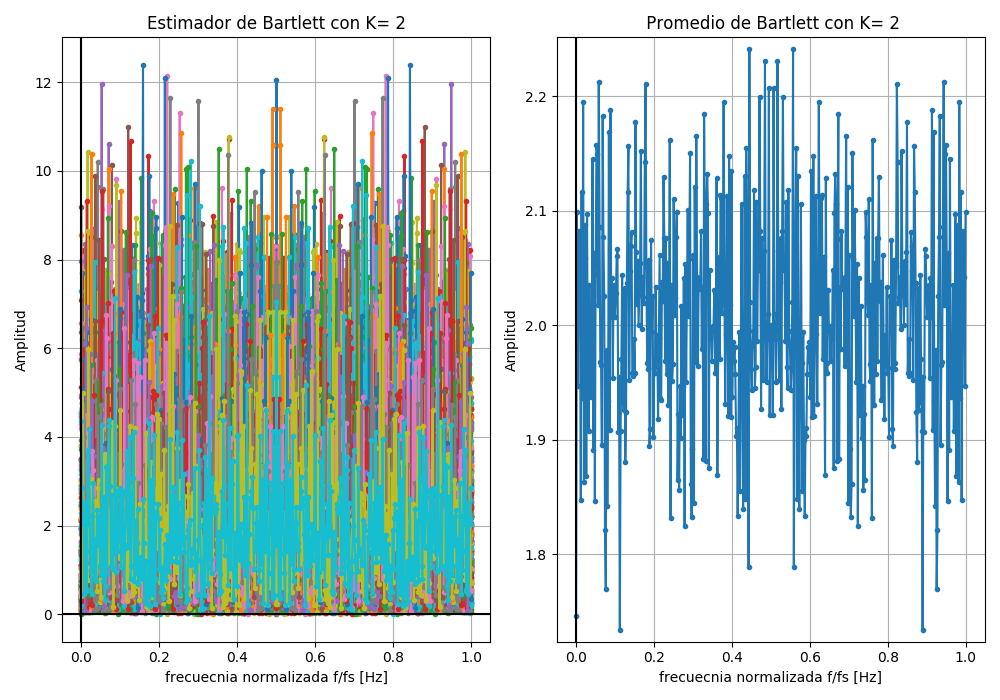

<IPython.core.display.Javascript object>


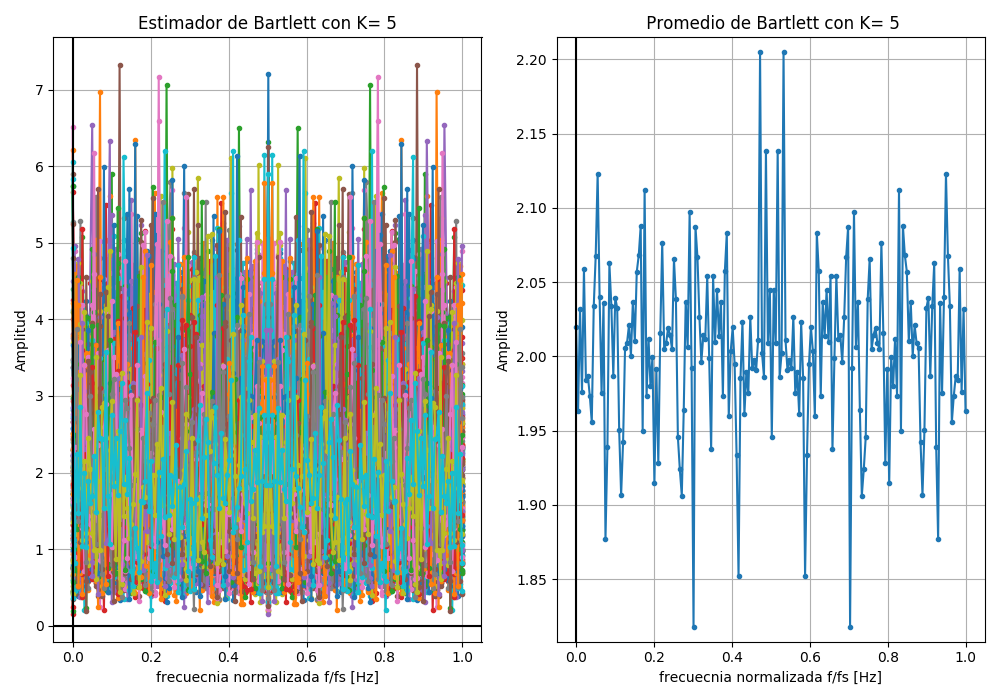

<IPython.core.display.Javascript object>


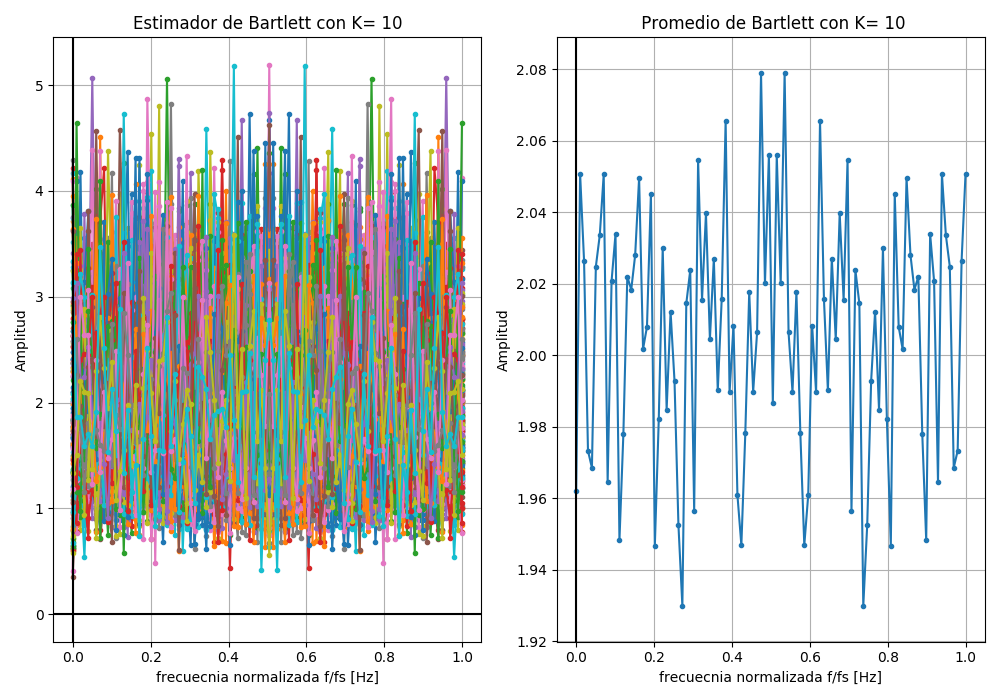

<IPython.core.display.Javascript object>


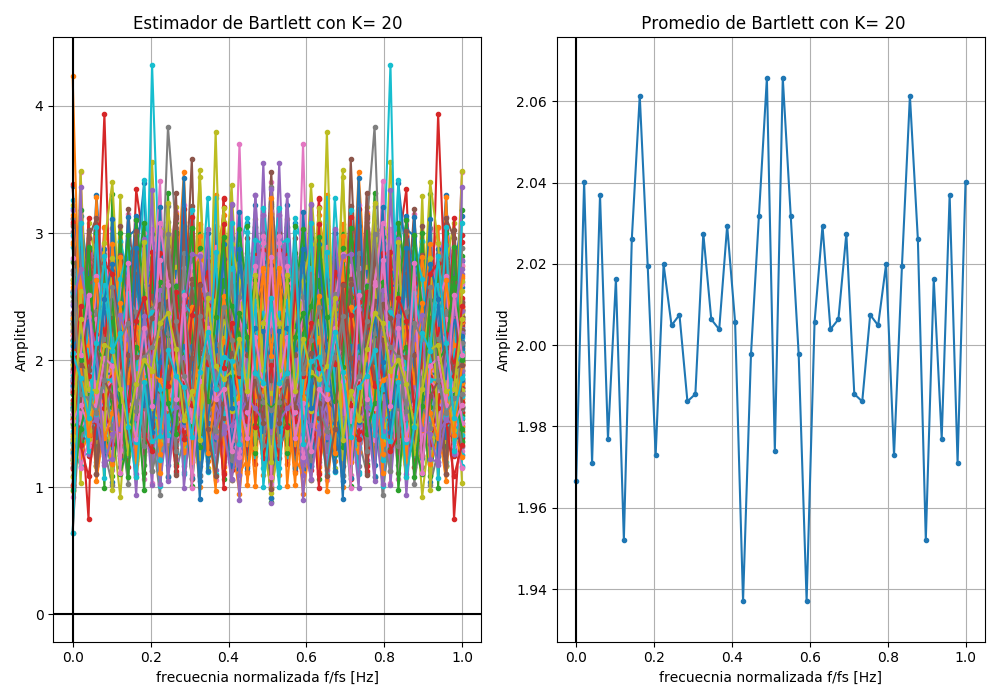

<IPython.core.display.Javascript object>


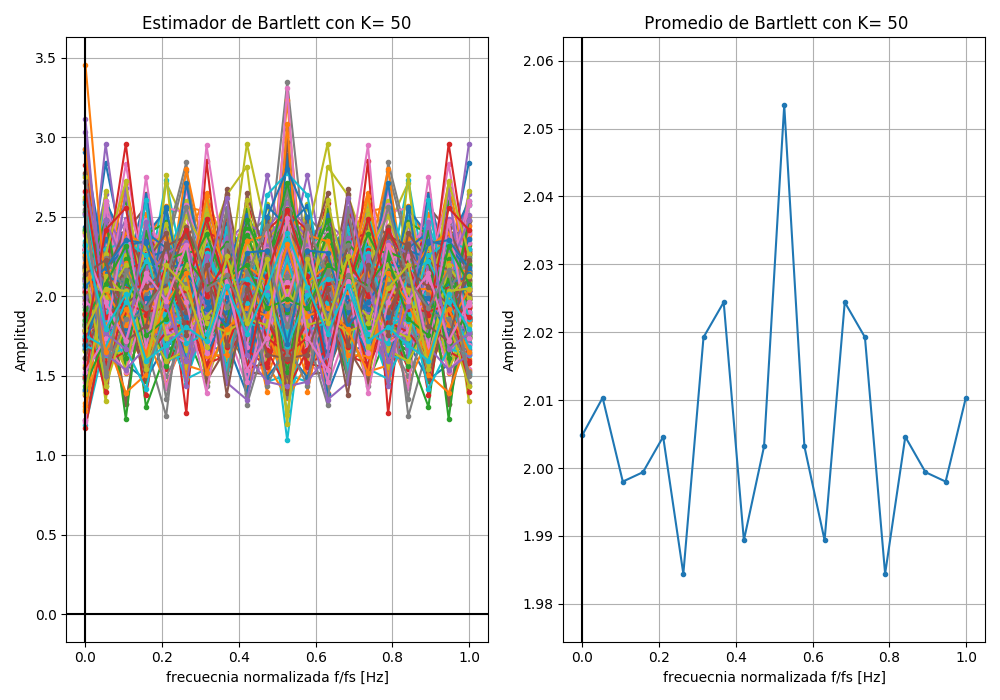

<IPython.core.display.Javascript object>


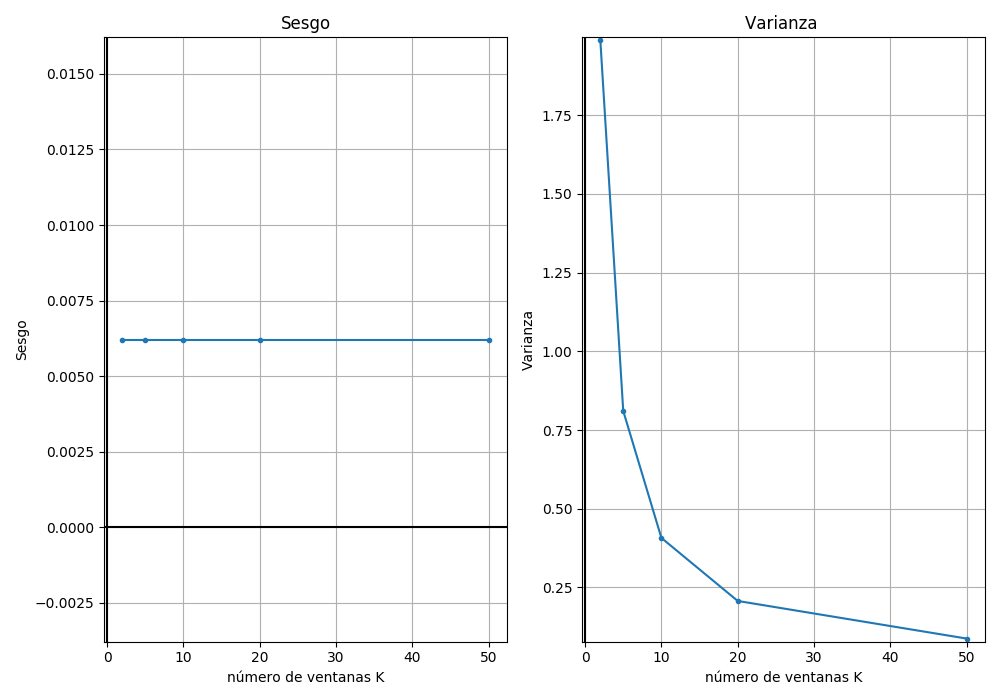

In [39]:
%matplotlib notebook
mpl.rcParams['figure.figsize'] = (10,7)

N = 1000
fs = 1000 # Hz
df = fs/N
Nexp = 200
mu = 0    # media (mu)
var = 2 # varianza
K = np.array([2, 5, 10, 20, 50], dtype=np.int)

##########################################
# Acá podés generar los gráficos pedidos #
##########################################
signal = signal5 # uso las señales creadas en el experimento anterior

#%% Bartlett
Sbar0 = np.vstack(np.transpose([sp.barlett(signal[:,ii], K=K[0], ax=0) for ii in range(Nexp)]))
Sbar1 = np.vstack(np.transpose([sp.barlett(signal[:,ii], K=K[1], ax=0) for ii in range(Nexp)]))
Sbar2 = np.vstack(np.transpose([sp.barlett(signal[:,ii], K=K[2], ax=0) for ii in range(Nexp)]))
Sbar3 = np.vstack(np.transpose([sp.barlett(signal[:,ii], K=K[3], ax=0) for ii in range(Nexp)]))
Sbar4 = np.vstack(np.transpose([sp.barlett(signal[:,ii], K=K[4], ax=0) for ii in range(Nexp)]))

#%% Cálculo de la energía 
energia0 = np.sum(Sbar0, axis=0) / (N/K[0])
energia1 = np.sum(Sbar1, axis=0) / (N/K[1])
energia2 = np.sum(Sbar2, axis=0) / (N/K[2])
energia3 = np.sum(Sbar3, axis=0) / (N/K[3])
energia4 = np.sum(Sbar4, axis=0) / (N/K[4])

#%% Valor medio muestreal
valor_medio_muestreal0 = np.mean(Sbar0, axis=1) 
valor_medio_muestreal1 = np.mean(Sbar1, axis=1) 
valor_medio_muestreal2 = np.mean(Sbar2, axis=1) 
valor_medio_muestreal3 = np.mean(Sbar3, axis=1) 
valor_medio_muestreal4 = np.mean(Sbar4, axis=1) 

#%% valor medio
valor_medio0 = np.mean(valor_medio_muestreal0, axis=0) 
valor_medio1 = np.mean(valor_medio_muestreal1, axis=0) 
valor_medio2 = np.mean(valor_medio_muestreal2, axis=0) 
valor_medio3 = np.mean(valor_medio_muestreal3, axis=0) 
valor_medio4 = np.mean(valor_medio_muestreal4, axis=0) 

#%% sesgo 
sesgo0 = np.abs(valor_medio0 - var)
sesgo1 = np.abs(valor_medio1 - var)
sesgo2 = np.abs(valor_medio2 - var)
sesgo3 = np.abs(valor_medio3 - var)
sesgo4 = np.abs(valor_medio4 - var)


#%% valor muestreal
var_muestreal0 = np.var(Sbar0, axis=1) 
var_muestreal1 = np.var(Sbar1, axis=1) 
var_muestreal2 = np.var(Sbar2, axis=1) 
var_muestreal3 = np.var(Sbar3, axis=1) 
var_muestreal4 = np.var(Sbar4, axis=1) 

#%% Varianza
varianza0 =  np.mean(var_muestreal0, axis=0)
varianza1 =  np.mean(var_muestreal1, axis=0)
varianza2 =  np.mean(var_muestreal2, axis=0)
varianza3 =  np.mean(var_muestreal3, axis=0)
varianza4 =  np.mean(var_muestreal4, axis=0)


#%%  Grafico 
A = ["2", "5", "10", "20", "50"]

## ejes de tiempo
tt = np.linspace(0, (N-1)/fs, N)  

freq0 = np.linspace(0, (N-1)*df, int(N/K[0])) / fs
freq1 = np.linspace(0, (N-1)*df, int(N/K[1])) / fs
freq2 = np.linspace(0, (N-1)*df, int(N/K[2])) / fs
freq3 = np.linspace(0, (N-1)*df, int(N/K[3])) / fs
freq4 = np.linspace(0, (N-1)*df, int(N/K[4])) / fs




#%%  Grafico de los resultados de K=2

plt.figure("Periodogramas de ruido blanco con K= " + A[0], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Bartlett con K= " + A[0])
plt.plot(freq0, Sbar0, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con K= " + A[0], constrained_layout=True)
plt.title(" Promedio de Bartlett con K= " + A[0])
plt.plot(freq0, valor_medio_muestreal0, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal0)-0.01, max(valor_medio_muestreal0)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=5

plt.figure("Periodogramas de ruido blanco con K= " + A[1], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Bartlett con K= " + A[1])
plt.plot(freq1, Sbar1, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con K= " + A[1], constrained_layout=True)
plt.title(" Promedio de Bartlett con K= " + A[1])
plt.plot(freq1, valor_medio_muestreal1, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal1)-0.01, max(valor_medio_muestreal1)+0.01)
plt.grid()
plt.tight_layout()


#%%  Grafico de los resultados de K=10

plt.figure("Periodogramas de ruido blanco con K= " + A[2], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Bartlett con K= " + A[2])
plt.plot(freq2, Sbar2, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
plt.title(" Promedio de Bartlett con K= " + A[2])
plt.plot(freq2, valor_medio_muestreal2, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal2)-0.01, max(valor_medio_muestreal2)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=20

plt.figure("Periodogramas de ruido blanco con K= " + A[3], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Bartlett con K= " + A[3])
plt.plot(freq3, Sbar3, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con K= " + A[3], constrained_layout=True)
plt.title(" Promedio de Bartlett con K= " + A[3])
plt.plot(freq3, valor_medio_muestreal3, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal3)-0.01, max(valor_medio_muestreal3)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=50

plt.figure("Periodogramas de ruido blanco con K= " + A[4], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Bartlett con K= " + A[4])
plt.plot(freq4, Sbar4, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Periodogramas de ruido blanco con K= " + A[4], constrained_layout=True)
plt.title(" Promedio de Bartlett con K= " + A[4])
plt.plot(freq4, valor_medio_muestreal4, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal4)-0.01, max(valor_medio_muestreal4)+0.01)
plt.grid()
plt.tight_layout()


#%% Gráfico de la varianza
varianza = [varianza0, varianza1, varianza2, varianza3, varianza4]
sesgo =[sesgo0, sesgo1, sesgo2, sesgo3, sesgo4]

plt.figure("Consistencia del estimador", constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Sesgo")
plt.plot(K, sesgo, marker='.')
plt.xlabel('número de ventanas K')
plt.ylabel("Sesgo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(sesgo)-0.01, max(sesgo)+0.01)
plt.grid()

plt.subplot(1,2,2)
plt.title("Varianza ")
plt.plot(K, varianza, marker='.')
plt.xlabel('número de ventanas K')
plt.ylabel("Varianza")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(varianza)-0.01, max(varianza)+0.01)
plt.grid()
plt.tight_layout()

In [41]:

#######################################
# Tu simulación que genere resultados #
#######################################

tus_resultados_bartlett = [
                   [sesgo0, varianza0], # <-- acá debería haber numeritos :)
                   [sesgo1, varianza1], # <-- acá debería haber numeritos :)
                   [sesgo2, varianza2], # <-- acá debería haber numeritos :)
                   [sesgo3, varianza3], # <-- acá debería haber numeritos :)
                   [sesgo4, varianza4], # <-- acá debería haber numeritos :)
                 ]
df = DataFrame(tus_resultados_bartlett, columns=['$s_B$', '$v_B$'],
               index=K)
HTML(df.to_html())


,$s_B$,$v_B$
2,0.006211,1.987477
5,0.006211,0.810702
10,0.006211,0.407370
20,0.006211,0.207138
50,0.006211,0.087657


<div class="alert alert-block alert-warning">
<b>Respuesta:</b> Podemos notar del último gráfico y del cuadro que el valor esperado se mantiene constante para un número de N dado. Sabemos de la bibliografía y de otras simulaciones que el valor esperado al igual que el estimador anterior es asisntóticamente no sesgado. También podemos notar que la varianza de este estimador es aisntóticamente no sesgado lo cuál lo convierte en un estimador <b>consistente</b>, que es lo mas importante. Esto se logra dividiendo nuestras señal en <b>K</b> bloques de igual longitud. Al hacer esto suponemos <b>K</b> bloques $x_i(k)$ son incorreladas. No esta de más recordar que esto solo es válido para señales <b>ergódicas</b>. Como todo en ingeniería el hecho de disminuír la varianza trae como consecuencia disminuir la resolución de nuestro estimador, por lo cual debemos encontrar el punto de compromiso para nuestro caso particular. En el caso de necesitar una varianza particular pero no podemos permitirnos perder resolución deberemos aumentar la cantidad de muestras.

De la bibliografía obtenemos la expresión de la varianza : $Var\{\hat{P_{bar}}(e^{\frac{2\pi·k·f_S}{N}})\} \cong \frac{1}{K} P_{bar}^2(e^{\frac{2\pi·k·f_S}{N}})$ y podemos comprobar que coincide con nuestros resultados.


Del último gráfico podemos notar que el sesgo se mantiene constante ya que todos los experimentos fueron realizados con un mismo tamaño <b>N</b>. Como mencione anteriormente este estimador es asintóticamente insesgado, lo que significa que si el tamaño <b>N</b> de nuestras señales disminuye, el sesgo aumentara, mientras que para mayor <b>N</b>  el sesgo decrementará siendo nulo para $ \lim_{N \to \infty}E\{\hat{P_{bar}(e^{j \omega})}\}=  P_{bar}(e^{j \omega})$
    
</div>

<div class="alert alert-block alert-info">
<b>3)</b>     Compruebe del mismo modo los resultados de sesgo y varianza vistos en la teoría del método de Welch.

</div>

Es decir, que el periodograma de Welch es un estimador de la densidad de potencia espectral que promedia K bloques ventaneados por $w(n)$, posiblemente solapados de las N muestras de una señal $x$ (Ver Hayes 8.2.5):

$$ \hat{P_W}(k) = \frac{1}{K·L·U}· \sum^{K-1}_{i=0} \Bigg\vert \sum^{L-1}_{n=0}  x(n+i·D) · w(n) · e^{-j2\pi·k·n·\frac{f_S}{N}} \Bigg\vert^2   $$

 + **no sesgado asintóticamente** a medida que aumenta la ventana de registro N.
 + tiene varianza que decrece asintóticamente, a medida que se promedian más bloques de señal.
 + tiene una resolución espectral inversamente proporcional al tamaño del bloque.

 **Voy a utilizar las mismas realizaciones que para el primer caso **

<IPython.core.display.Javascript object>


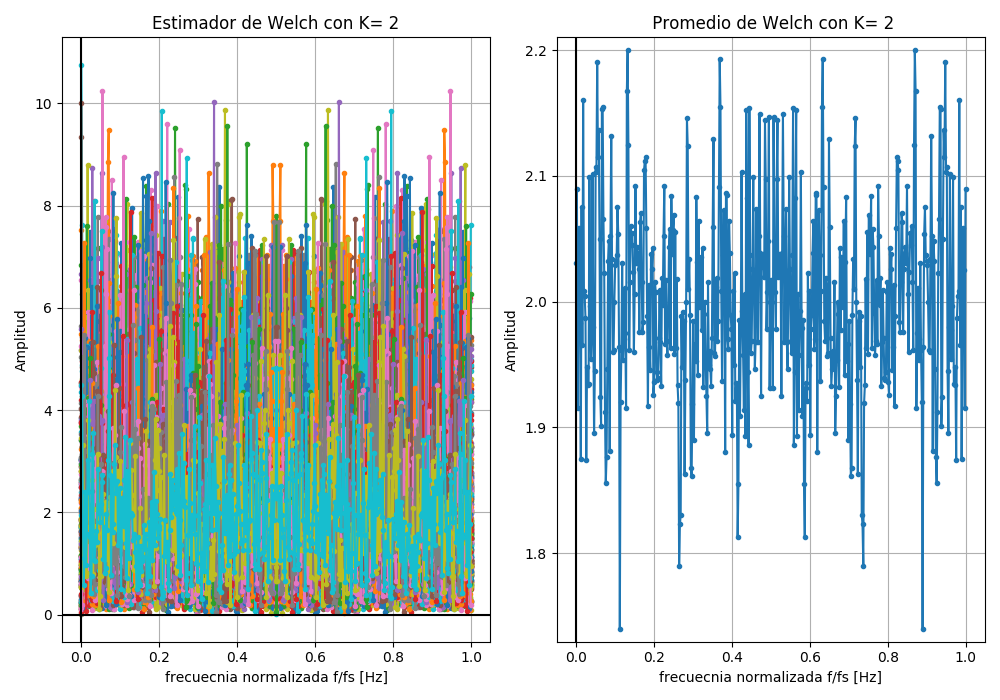

<IPython.core.display.Javascript object>


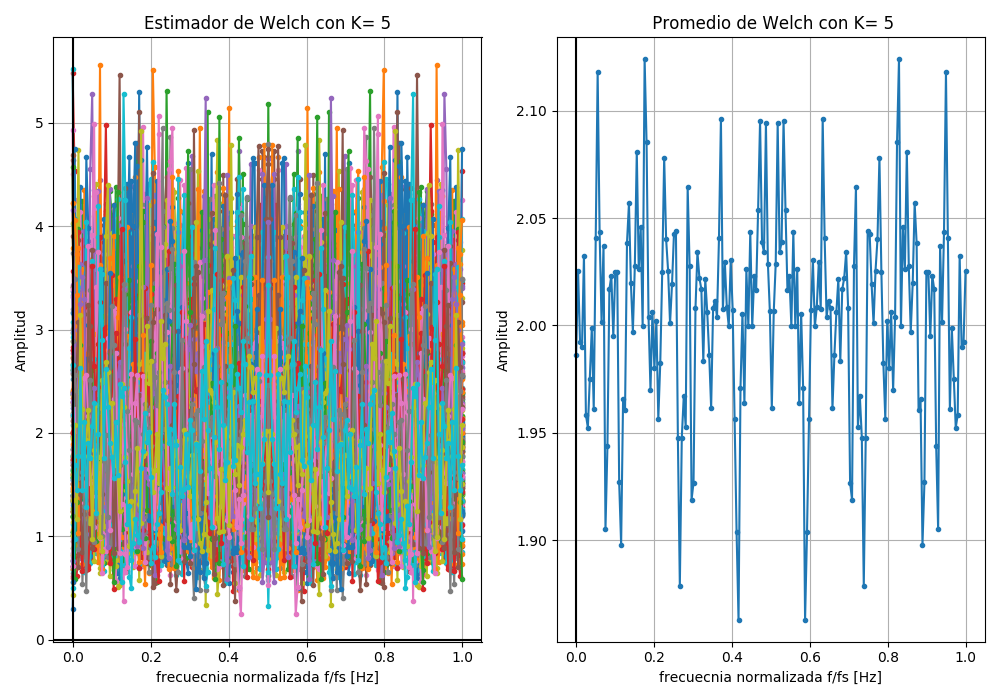

<IPython.core.display.Javascript object>


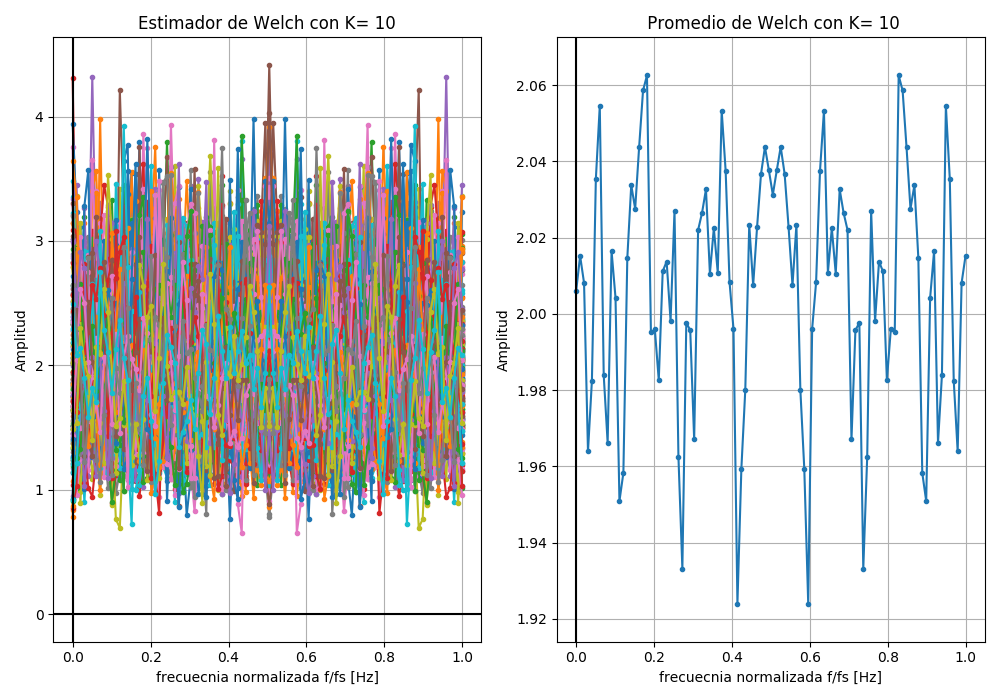

<IPython.core.display.Javascript object>


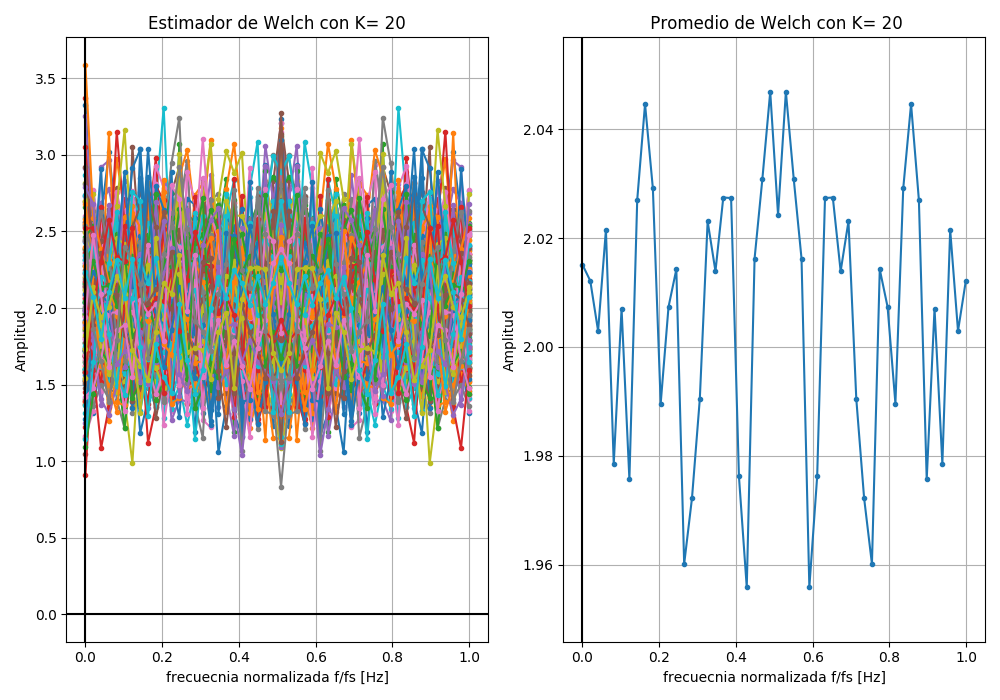

<IPython.core.display.Javascript object>


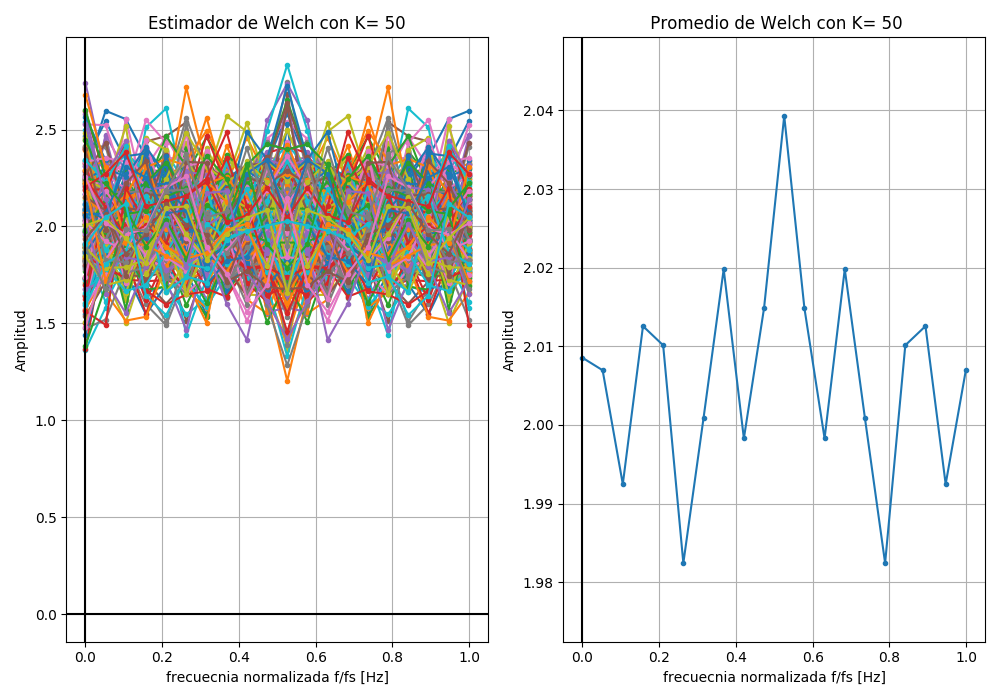

<IPython.core.display.Javascript object>


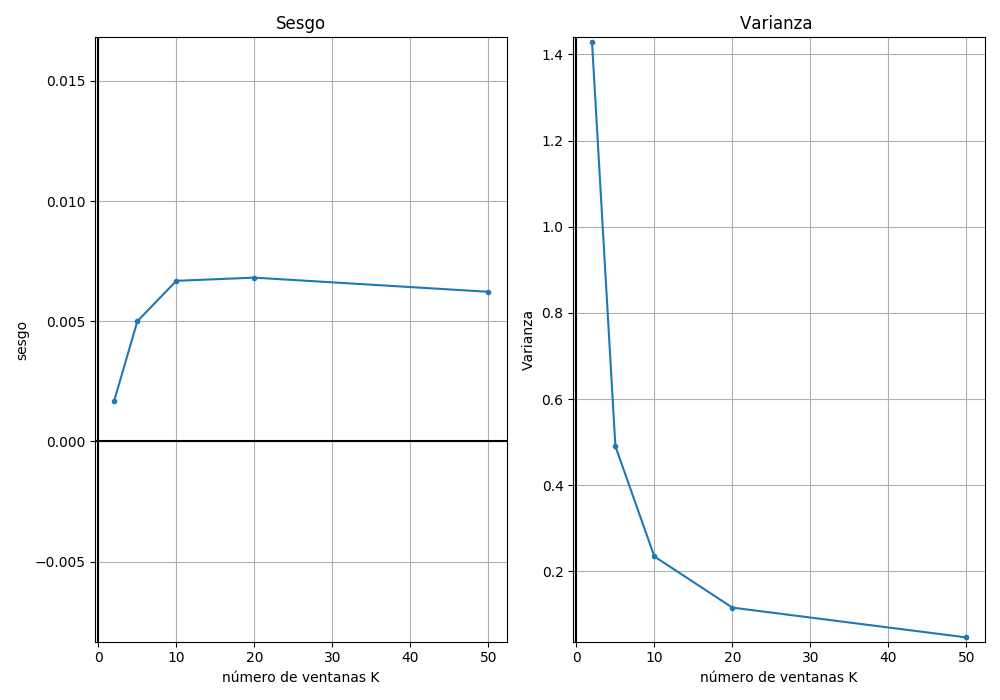

In [42]:
%matplotlib notebook
mpl.rcParams['figure.figsize'] = (10,7)

N = 1000
fs = 1000 # Hz
df = fs/N
Nexp = 200
over = 0.5
mu = 0    # media (mu)
var = 2 # varianza
K = np.array([2, 5, 10, 20, 50], dtype=np.int)
L = N/K

##########################################
# Acá podés generar los gráficos pedidos #
##########################################

signal = signal5 # uso las señales creadas en el experimento anterior

#%% Welch
Swelch0 = np.vstack(np.transpose([sp.welch(signal[:,ii], L=L[0], over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))
Swelch1 = np.vstack(np.transpose([sp.welch(signal[:,ii], L=L[1], over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))
Swelch2 = np.vstack(np.transpose([sp.welch(signal[:,ii], L=L[2], over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))
Swelch3 = np.vstack(np.transpose([sp.welch(signal[:,ii], L=L[3], over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))
Swelch4 = np.vstack(np.transpose([sp.welch(signal[:,ii], L=L[4], over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))

#%% Cálculo de la energía 
energia0 = np.sum(Swelch0, axis=0) / (N/K[0])
energia1 = np.sum(Swelch1, axis=0) / (N/K[1])
energia2 = np.sum(Swelch2, axis=0) / (N/K[2])
energia3 = np.sum(Swelch3, axis=0) / (N/K[3])
energia4 = np.sum(Swelch4, axis=0) / (N/K[4])

#%% Valor medio muestreal
valor_medio_muestreal0 = np.mean(Swelch0, axis=1) 
valor_medio_muestreal1 = np.mean(Swelch1, axis=1) 
valor_medio_muestreal2 = np.mean(Swelch2, axis=1) 
valor_medio_muestreal3 = np.mean(Swelch3, axis=1) 
valor_medio_muestreal4 = np.mean(Swelch4, axis=1) 

#%% valor medio
valor_medio0 = np.mean(valor_medio_muestreal0, axis=0) 
valor_medio1 = np.mean(valor_medio_muestreal1, axis=0) 
valor_medio2 = np.mean(valor_medio_muestreal2, axis=0) 
valor_medio3 = np.mean(valor_medio_muestreal3, axis=0) 
valor_medio4 = np.mean(valor_medio_muestreal4, axis=0) 

#%% sesgo 
sesgo0 = np.abs(valor_medio0 - var)
sesgo1 = np.abs(valor_medio1 - var)
sesgo2 = np.abs(valor_medio2 - var)
sesgo3 = np.abs(valor_medio3 - var)
sesgo4 = np.abs(valor_medio4 - var)

#%% varianza muestreal
var_muestreal0 = np.var(Swelch0, axis=1) 
var_muestreal1 = np.var(Swelch1, axis=1) 
var_muestreal2 = np.var(Swelch2, axis=1) 
var_muestreal3 = np.var(Swelch3, axis=1) 
var_muestreal4 = np.var(Swelch4, axis=1) 

#%% Varianza
varianza0 =  np.mean(var_muestreal0, axis=0)
varianza1 =  np.mean(var_muestreal1, axis=0)
varianza2 =  np.mean(var_muestreal2, axis=0)
varianza3 =  np.mean(var_muestreal3, axis=0)
varianza4 =  np.mean(var_muestreal4, axis=0)


#%%  Grafico 
A = ["2", "5", "10", "20", "50"]

## ejes de tiempo
tt = np.linspace(0, (N-1)/fs, N)  

freq0 = np.linspace(0, (N-1)*df, int(N/K[0])) / fs
freq1 = np.linspace(0, (N-1)*df, int(N/K[1])) / fs
freq2 = np.linspace(0, (N-1)*df, int(N/K[2])) / fs
freq3 = np.linspace(0, (N-1)*df, int(N/K[3])) / fs
freq4 = np.linspace(0, (N-1)*df, int(N/K[4])) / fs




#%%  Grafico de los resultados de K=2

plt.figure("Estimador de Welch para ruido blanco con K= " + A[0], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Welch con K= " + A[0])
plt.plot(freq0, Swelch0, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Estimador de Welch para de ruido blanco con K= " + A[0], constrained_layout=True)
plt.title(" Promedio de Welch con K= " + A[0])
plt.plot(freq0, valor_medio_muestreal0, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal0)-0.01, max(valor_medio_muestreal0)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=5

plt.figure("Estimador de Welch para ruido blanco con K= " + A[1], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Welch con K= " + A[1])
plt.plot(freq1, Swelch1, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Estimador de Welch para ruido blanco con K= " + A[1], constrained_layout=True)
plt.title(" Promedio de Welch con K= " + A[1])
plt.plot(freq1, valor_medio_muestreal1, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal1)-0.01, max(valor_medio_muestreal1)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=10

plt.figure("Estimador de Welch para ruido blanco con K= " + A[2], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Welch con K= " + A[2])
plt.plot(freq2, Swelch2, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Estimador de Welch para de ruido blanco con K= " + A[2], constrained_layout=True)
plt.title(" Promedio de Welch con K= " + A[2])
plt.plot(freq2, valor_medio_muestreal2, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal2)-0.01, max(valor_medio_muestreal2)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=20

plt.figure("Estimador de Welch para ruido blanco con K= " + A[3], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Welch con K= " + A[3])
plt.plot(freq3, Swelch3, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

plt.subplot(1,2,2)
#plt.figure("Promedio de los Estimador de Welch para ruido blanco con K= " + A[3], constrained_layout=True)
plt.title(" Promedio de Welch con K= " + A[3])
plt.plot(freq3, valor_medio_muestreal3, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal3)-0.01, max(valor_medio_muestreal3)+0.01)
plt.grid()
plt.tight_layout()

#%%  Grafico de los resultados de K=50
plt.figure("Estimador de Welch para ruido blanco con K= " + A[4], constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Estimador de Welch con K= " + A[4])
plt.plot(freq4, Swelch4, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()
plt.subplot(1,2,2)
#plt.figure("Promedio de los Estimador de Welch para ruido blanco con K= " + A[4], constrained_layout=True)
plt.title(" Promedio de Welch con K= " + A[4])
plt.plot(freq4, valor_medio_muestreal4, marker='.')
plt.xlabel('frecuecnia normalizada f/fs [Hz]')
plt.ylabel("Amplitud")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(valor_medio_muestreal4)-0.01, max(valor_medio_muestreal4)+0.01)
plt.grid()
plt.tight_layout()

#%% Gráfico de la varianza
varianza = [varianza0, varianza1, varianza2, varianza3, varianza4]
sesgo =[sesgo0, sesgo1, sesgo2, sesgo3, sesgo4]

plt.figure("Consistencia del estimador", constrained_layout=True)
plt.subplot(1,2,1)
plt.title("Sesgo")
plt.plot(K, sesgo, marker='.')
plt.xlabel('número de ventanas K')
plt.ylabel("sesgo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(sesgo)-0.01, max(sesgo)+0.01)
plt.grid()

plt.subplot(1,2,2)
plt.title("Varianza ")
plt.plot(K, varianza, marker='.')
plt.xlabel('número de ventanas K')
plt.ylabel("Varianza")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.ylim(min(varianza)-0.01, max(varianza)+0.01)
plt.grid()
plt.tight_layout()


In [43]:

#######################################
# Tu simulación que genere resultados #
#######################################

tus_resultados_welch  = [ 
                   [sesgo0, varianza0], # <-- acá debería haber numeritos :)
                   [sesgo1, varianza1], # <-- acá debería haber numeritos :)
                   [sesgo2, varianza2], # <-- acá debería haber numeritos :)
                   [sesgo3, varianza3], # <-- acá debería haber numeritos :)
                   [sesgo4, varianza4], # <-- acá debería haber numeritos :)
                 ]

df = DataFrame(tus_resultados_welch, columns=['$s_B$', '$v_B$'],
               index=K)
HTML(df.to_html())


,$s_B$,$v_B$
2,0.001665,1.429686
5,0.005005,0.490646
10,0.006685,0.234783
20,0.006817,0.116146
50,0.006228,0.046958


<div class="alert alert-block alert-warning">
<b>Respuesta:</b> Podemos notar del último gráfico y del cuadro que el valor esperado se mantiene constante para un número de N dado.Esto se debe a que todos los experimentos fueron realizados con un mismo tamaño <b>N</b> como en el caso del estimador de Bartlett. Sabemos de la bibliografía y lo comprobamos en otras simulaciones que el valor esperado al igual que el estimador anterior es asisntóticamente no sesgado. También podemos notar que la varianza de este estimador es aisntóticamente no sesgado lo cuál lo convierte en un estimador <b>consistente</b>, que es lo mas importante. Esto se logra dividiendo nuestras señal en <b>K</b> bloques de igual longitud. Al hacer esto suponemos <b>K</b> bloques $x_i(k)$ son incorreladas. No esta de más recordar que esto solo es válido para señales <b>ergódicas</b>. Además se superponen las <b>K</b> ventanas, en este caso utilizamos un solapamiento del 50% y también se eventaneo con una ventana <b>Bartlett</b> que es lo mas común pero podria usarse otra. Con estas mejoras logramos disminuir aún mas la varianza como podemos notar en la tabla anterior.

Para estas simulaciones en particular, al mantener el mismo N y los mismos valor de <b>K</b> que en el estimador de <b>Bartlett</b> mantenemos la misma resolución con una menor varianza. Otra cosa que probé en otras simulaciones fue aumentar el tamaño de $L_{Welch}$ = $2L_{Bartlett}$ tenemos con <b>Welch</b> el doble de resolución con la misma varianza que tendríamos con el estimador de Bartlett. Esto se puede evidenciar en la ecuación siguiente:

$$ N = L + D(K - 1)$$
y como $$D = \frac{L}{2}$$ operando
$$K_W = \frac{2N}{L} -1$$

$$ K_B = \frac{N}{L} $$

Al utilizar el mismo L (recordemos la anterior), el método de Welch tiene el doble de ventanas(para hacer el Periodograma), por lo tanto reduce la varianza y mantiene la resolución espectral. Del mismo modo al aumentar
$L_{Welch}$ = $2L_{Bartlett}$ (disminuimos K) obtenemos la misma cantidad de ventanas, por lo tanto se mantiene la varianza, pero como la ventana es mas grande obtenemos mas resoluci´on

De la bibliografía obtenemos la expresión de la varianza : $Var\{\hat{P_{W}}(e^{\frac{2\pi·k·f_S}{N}})\} \cong \frac{9}{16} Var\{\hat{P_{Bar}}(e^{\frac{2\pi·k·f_S}{N}})\}$ y podemos comprobar que coincide con nuestros resultados.

Podemos concluír que de los tres estimadores analizados y agregando el <b>Periodograma Modificado</b> (del cual realize simulaciones que no mostré aquí), el que presenta mejores características es el estimador de <b>Welch</b> aunque tambíen es el que mayor costo computacional tiene.
</div>

<div class="alert alert-block alert-info">
<b>4)</b> Evalue el siguiente estimador de frecuencia de una senoidal contaminada por ruido incorrelado.

</div>

Para una señal $ x(k) = a_1 · \mathop{sen}(\Omega_1·k) + n(k)$

siendo 

  $\Omega_1 = \Omega_0 + f_r·\frac{2\pi}{N} $

  $\Omega_0 = \frac{\pi}{2} $
  
y las variables aleatorias definidas por

  $f_r \sim \mathcal{U}(-\frac{1}{2}, \, \frac{1}{2}) $

  $n \sim \mathcal{N}(0, \, \sigma ^2) $
  
Evalúe el siguiente estimador de $\Omega_1$

  $\hat{\Omega}_1^W = \mathop{arg\ max}_f \{ \hat{P_W} \} $
  
basado en el periodograma de Welch evaluado en **3)**. Del mismo modo, evalúe otro estimador de la PSD para crear otro estimador de $\Omega_1$

  $\hat{\Omega}_1^X = \mathop{arg\ max}_f \{ \hat{P_X} \} $

Considere 200 realizaciones de 1000 muestras para cada experimento. Cada realización debe tener un SNR tal que el pico de la senoidal esté 3 y 10 db por encima del *piso* de ruido impuesto por $n(k)$.


<div class="alert alert-block alert-success">
<b>Ayuda:</b> Puede utilizar el módulo de análisis espectral <b>Spectrum</b> donde encontrará la mayoría de los métodos descriptos en el Capítulo 8 del libro de Hayes.

</div>

<IPython.core.display.Javascript object>


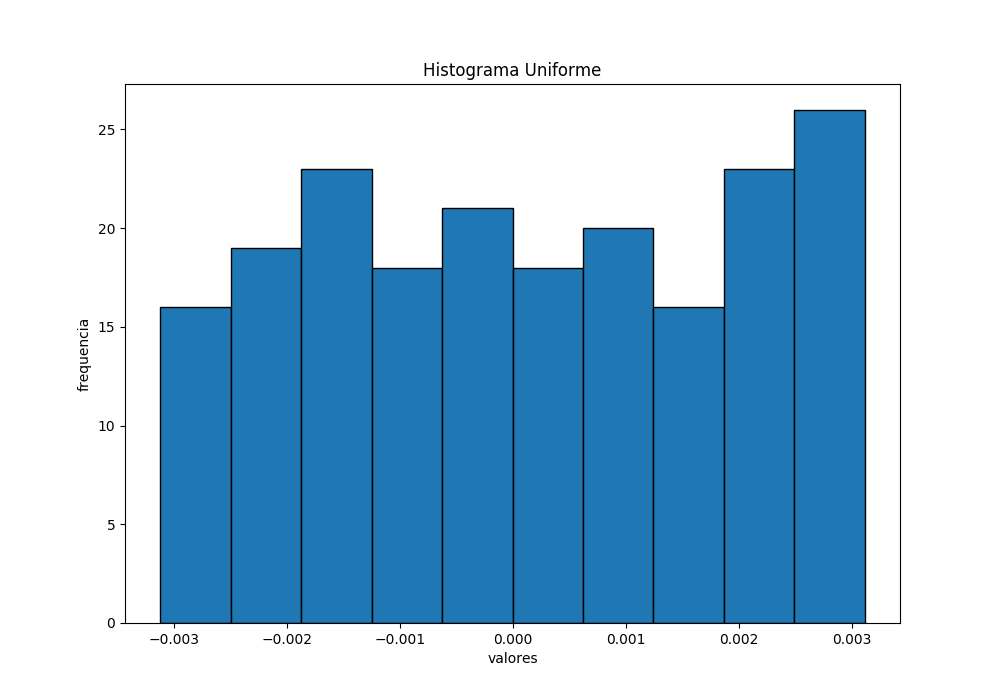

<IPython.core.display.Javascript object>


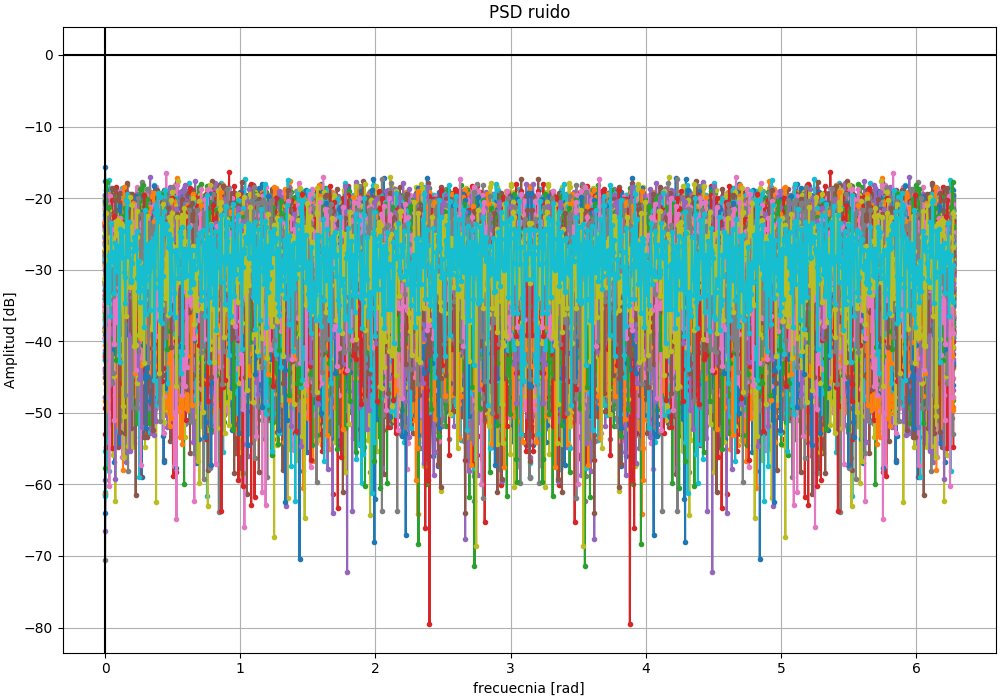

<IPython.core.display.Javascript object>


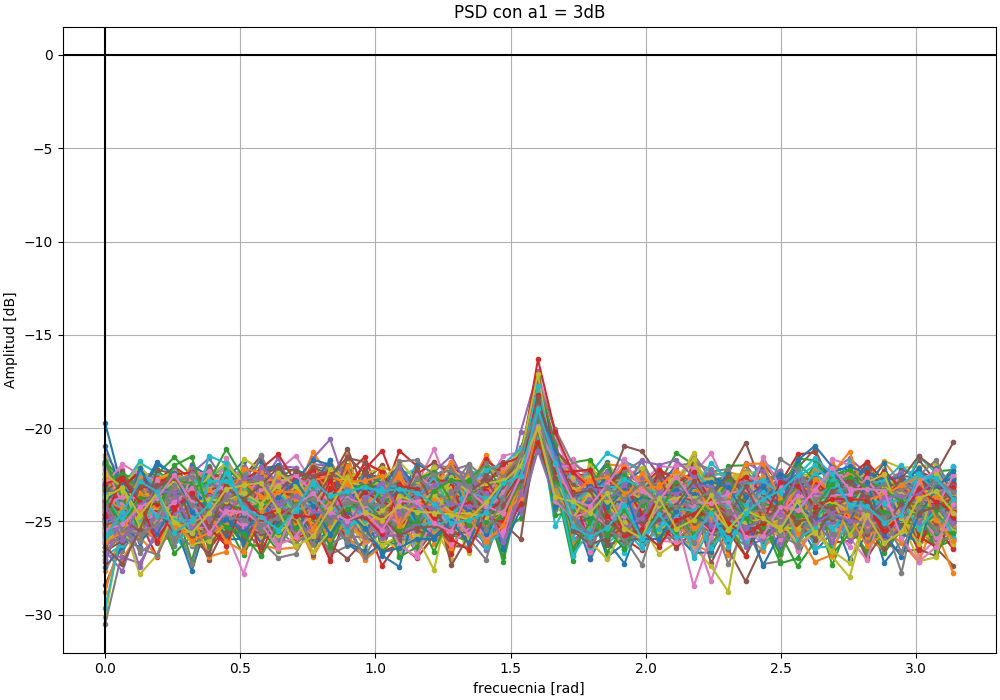

<IPython.core.display.Javascript object>


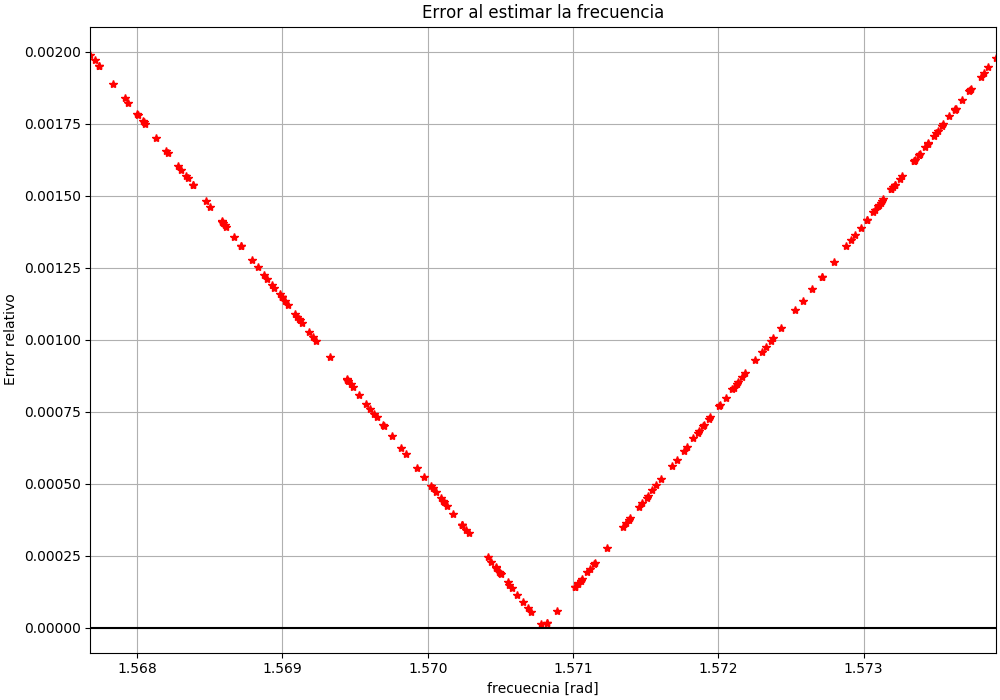

<IPython.core.display.Javascript object>


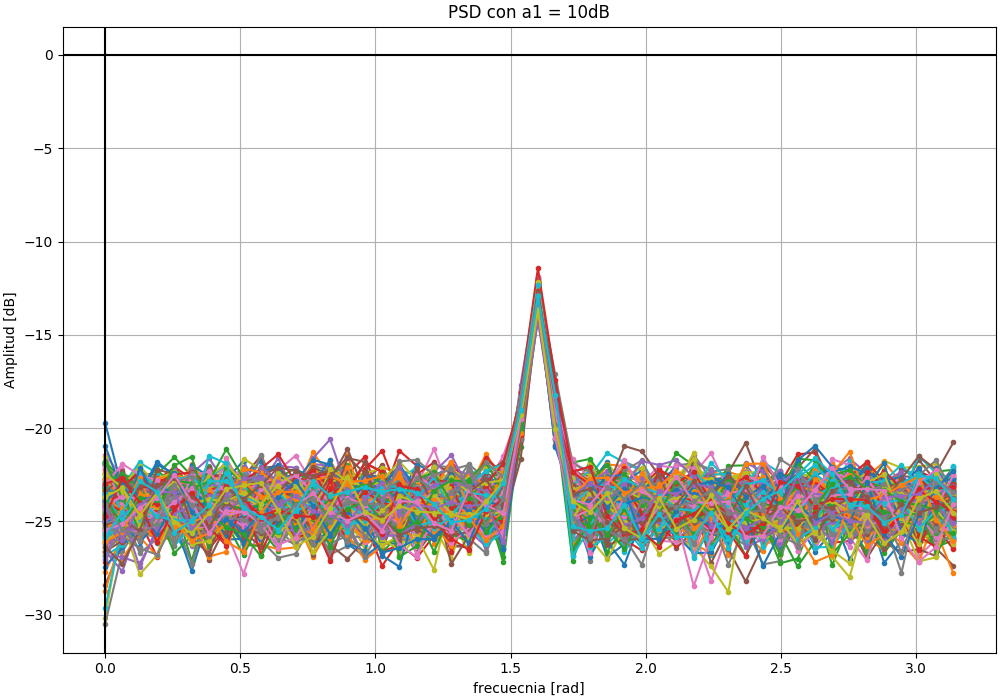

<IPython.core.display.Javascript object>


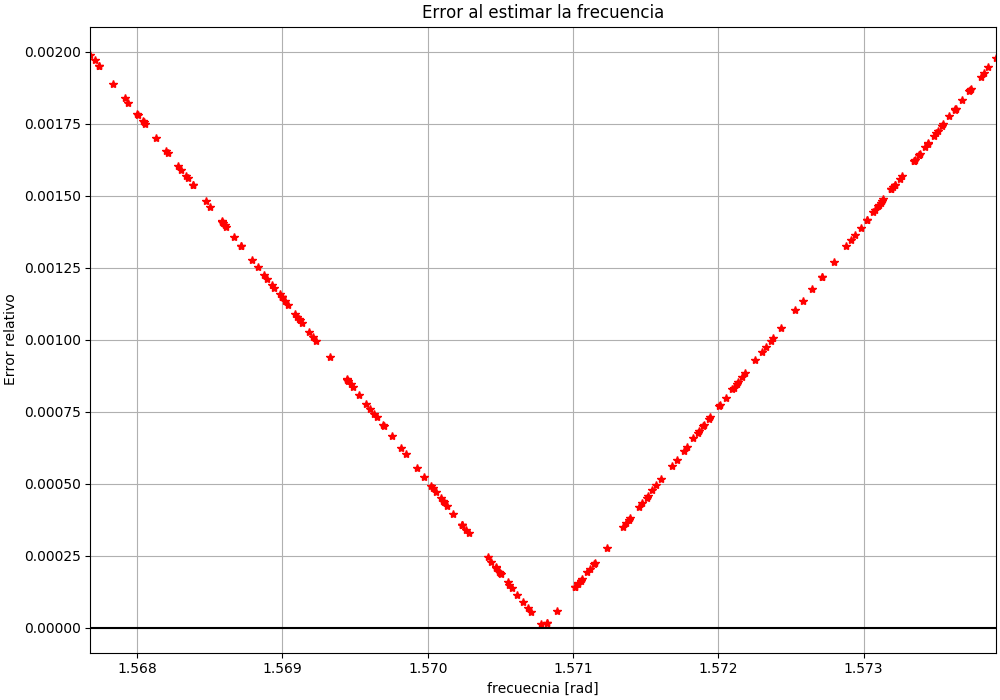

In [13]:
%matplotlib notebook
mpl.rcParams['figure.figsize'] = (10,7)

N    = 1000
Nexp = 200
fs   = 2*np.pi # Hz
df   = fs/N
f0   = np.pi / 2
over = 0.5
mu   = 0    # media (mu)
var  = 2 # varianza
K    = 10
L    = N/K
SNR  = [-15, -8] #db
a1   = 2*np.sqrt(var)*pow(10,SNR[0]/20)
a2   = 2*np.sqrt(var)*pow(10,SNR[1]/20)
a    = (-1/2) *df
b    = (1/2) * df

#%% generación de frecuencias aleatorias
fa = np.random.uniform(a, b, size = (Nexp)) # genera aleatorios
f1 = f0 + fa   

plt.hist(fa, bins=10, alpha=1, edgecolor = 'black',  linewidth=1)
plt.ylabel('frequencia')
plt.xlabel('valores')
plt.title('Histograma Uniforme')
plt.savefig("Histograma.png")
plt.show()

del fa


#%% generación de señales    
noise= np.vstack(np.transpose([ np.random.normal(0, np.sqrt(var), N)  for j in range(Nexp)]))

fftnoise = 10*np.log10(np.abs(fft(noise, axis=0)/N)**2)
#%% Gráficos de la PSD
jj = np.linspace(0, (N-1)*df, N)
plt.figure("PSD ruido", constrained_layout=True)
plt.title("PSD ruido")
plt.plot(jj, fftnoise, marker='.')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Amplitud [dB]")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

#%% generación de señales 
tt = np.linspace(0, (N-1)/fs, N)     
senoidal1 = np.vstack(np.transpose([a1 * np.sin(2*np.pi*j*tt) for j in f1]))  
senoidal2 = np.vstack(np.transpose([a2 * np.sin(2*np.pi*j*tt) for j in f1]))  
del tt   

signal1 = senoidal1 + noise
signal2 = senoidal2 + noise

Swelch1 = np.vstack(np.transpose([sp.welch(signal1[:,ii], L=L, over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))
Swelch1 = 10*np.log10(Swelch1 *2/N)
Swelch1 = Swelch1 [:int(L/2),:]

Swelch2 = np.vstack(np.transpose([sp.welch(signal2[:,ii], L=L, over=over, win="Bartlett", ax=0) for ii in range(Nexp)]))
Swelch2 = 10*np.log10(Swelch2 *2/N)
Swelch2 = Swelch2 [:int(L/2),:]

freq_hat1 = np.argmax(Swelch1, axis=0)*fs/L # estimo la frecuecnia 
freq_hat2 = np.argmax(Swelch2, axis=0)*fs/L # estimo la frecuecnia 

error_freq1_W = np.abs(freq_hat1 - f1)/f1  # calculo el error absoluto
error_medio1_W = np.mean(error_freq1_W)

error_freq2_W = np.abs(freq_hat2 - f1)/f1  # calculo el error absoluto
error_medio2_W = np.mean(error_freq2_w)

#%% Gráficos de la PSD
ff = np.linspace(0, (N-1)*df/2, int(L/2))
plt.figure("PSD PSD con a1 = 3dB", constrained_layout=True)
plt.title("PSD con a1 = 3dB")
plt.plot(ff, Swelch1, marker='.')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Amplitud [dB]")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

# Gráfico del error absoluto
plt.figure("Error al estimar la frecuencia con a1 = 3dB", constrained_layout=True)
plt.title("Error al estimar la frecuencia")
plt.plot(f1, error_freq1_W,'*r')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Error relativo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.xlim((min(f1), max(f1)))
plt.grid()


ff = np.linspace(0, (N-1)*df/2, int(L/2))
plt.figure("PSD con a1 = 10dB", constrained_layout=True)
plt.title("PSD con a1 = 10dB")
plt.plot(ff, Swelch2, marker='.')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Amplitud [dB]")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

# Gráfico del error absoluto
plt.figure("Error al estimar la frecuencia con a1 = 10dB", constrained_layout=True)
plt.title("Error al estimar la frecuencia")
plt.plot(f1, error_freq2_W,'*r')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Error relativo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.xlim((min(f1), max(f1)))
plt.grid()


   a) ¿Qué estimador ha elegido? Explique brevemente los fundamentos principales y el enfoque del método elegido.


<div class="alert alert-block alert-warning">
    <b>Respuesta:</b> Elegí utilizar el estimador de <b>Blackman-Tukey</b> que utiliza otra forma de reducir la varianza del <b>periodograma</b>.  
    
   La varianza de $\hat{r}_X(K)$ va a ser grande para valores de k cercanos a N ya que hay pocas muestras de información , por ejemplo para k = N-1 $\hat{r}_x(N-1) = \frac{1}{N} x(N-1) x(0)$ independientemente del valor de N.
   
   A diferencia del periodograma que reduce la varianza reduciendo la varianza del estimador, Blackman-Tukey la reduce reduciendo la contribución de los extremos de la función de autocorrelación que son los valores con menor información filedigna de la autocorrelación . Para ello propone enventanear la función de autocorrelación.
   
   $$ \hat{P}_BT(e^{jw}) = \sum^{K=-M}_{M} \hat{r}_x(k).W(k)e^{-jwk}$$
   
   siendo M el tamaño de la vetana desde el centro hacia hacia ambos extremos (la ventana es en realidad 2M +1).
   
   La ventana debe ser conjugada simétrica para que su transformada sea real y positiva para garantizar que su estimador no sea negativo.
   
   Por lo general el tamaño de <b> M = N / 5 </b>
    
   Con esto se obtiene un Periodograma suavizado como se verá en los gráficos siguientes. 
   
</div>

<IPython.core.display.Javascript object>


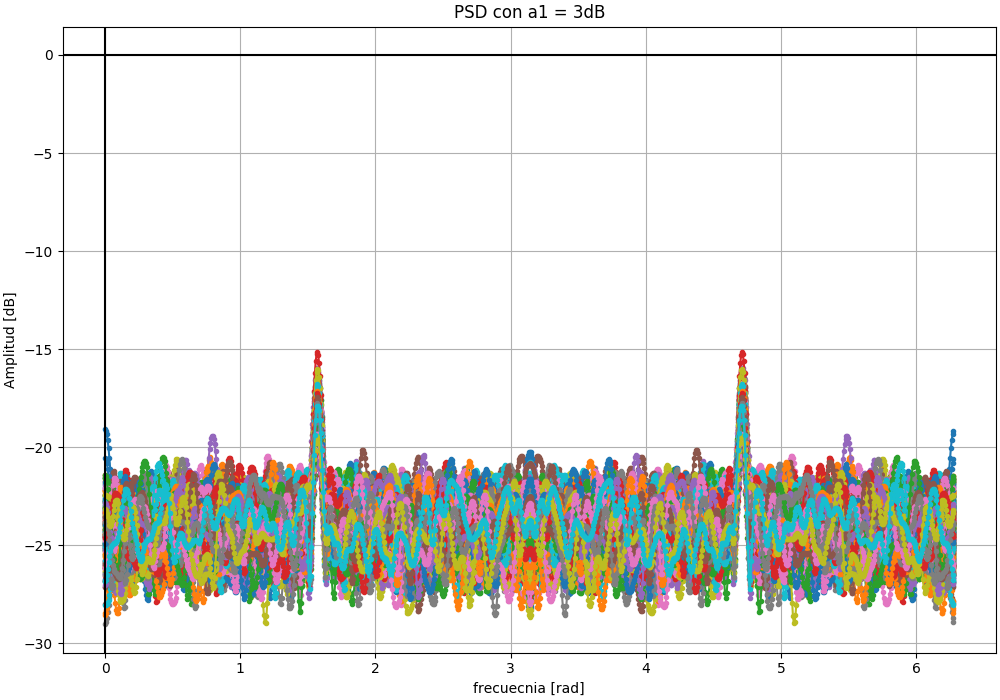

<IPython.core.display.Javascript object>


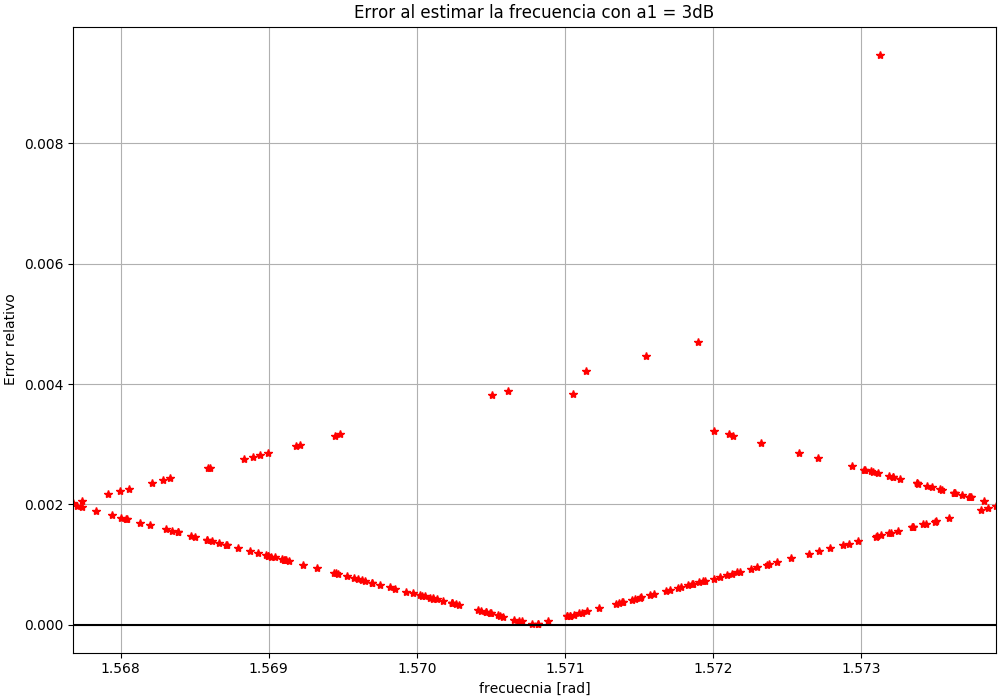

<IPython.core.display.Javascript object>


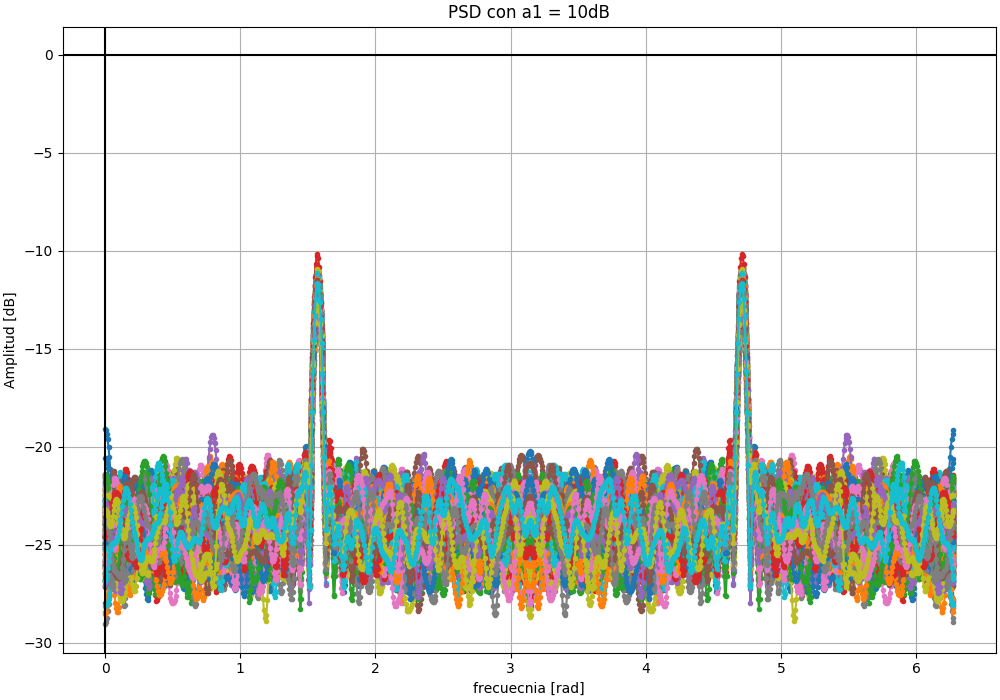

<IPython.core.display.Javascript object>


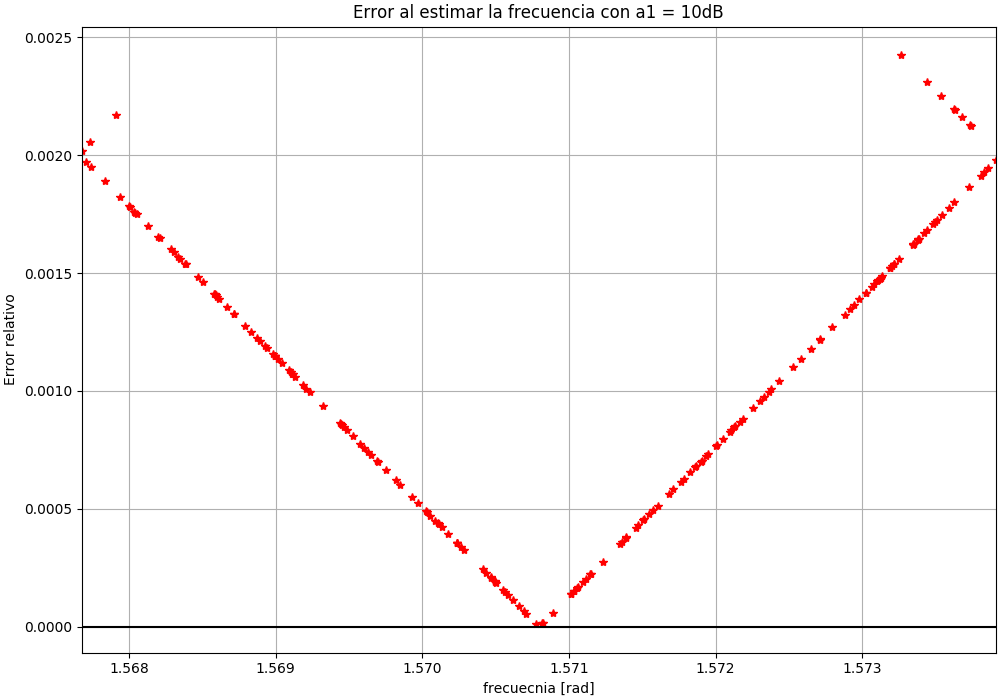

In [15]:
%matplotlib notebook
mpl.rcParams['figure.figsize'] = (10,7)
from spectrum import CORRELOGRAMPSD

M    = 100

S_BT1 = np.vstack(np.transpose([CORRELOGRAMPSD(signal1[:,ii],window='bartlett', lag=M, NFFT=N) for ii in range(Nexp)]))
S_BT1 = 10*np.log10(S_BT1 *2/N)

S_BT2 = np.vstack(np.transpose([CORRELOGRAMPSD(signal2[:,ii],window='bartlett', lag=M, NFFT=N) for ii in range(Nexp)]))
S_BT2 = 10*np.log10(S_BT2 *2/N)


freq_hat1 = np.argmax(S_BT1[:int(N/2)-1,:], axis=0)*df # estimo la frecuecnia 
freq_hat2 = np.argmax(S_BT2[:int(N/2)-1,:], axis=0)*df # estimo la frecuecnia 

error_freq1_BT = np.abs(freq_hat1 - f1)/f1  # calculo el error absoluto
error_freq2_BT = np.abs(freq_hat2 - f1)/f1  # calculo el error absoluto

error_medio1_BT = np.mean(error_freq1_BT)
error_medio2_BT = np.mean(error_freq2_BT)

#%% Gráficos de la PSD
ff = np.linspace(0, (N-1)*df, N)
plt.figure("PSD con a1 = 3dB", constrained_layout=True)
plt.title("PSD con a1 = 3dB")
plt.plot(ff, S_BT1, marker='.')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Amplitud [dB]")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

# Gráfico del error absoluto
plt.figure("Error al estimar la frecuencia con a1 = 3dB", constrained_layout=True)
plt.title("Error al estimar la frecuencia con a1 = 3dB")
plt.plot(f1, error_freq1_BT,'*r')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Error relativo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.xlim((min(f1), max(f1)))
plt.grid()


plt.figure("PSD con a1 = 10dB", constrained_layout=True)
plt.title("PSD con a1 = 10dB")
plt.plot(ff, S_BT2, marker='.')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Amplitud [dB]")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.grid()

# Gráfico del error absoluto
plt.figure("Error al estimar la frecuencia con a1 = 10dB", constrained_layout=True)
plt.title("Error al estimar la frecuencia con a1 = 10dB")
plt.plot(f1, error_freq2_BT,'*r')
plt.xlabel('frecuecnia [rad]')
plt.ylabel("Error relativo")
plt.axhline(0, color="black")
plt.axvline(0, color="black")
plt.xlim((min(f1), max(f1)))
plt.grid()

   b) ¿Qué indicador considera que sería apropiado para poder comparar el rendimiento de ambos estimadores $i_j$?


<div class="alert alert-block alert-warning">
<b>Respuesta:</b> Como indicador para comparar ambos estimadores propongo utilizar la varianza de los error cometido al estimar la frecuencia. POdemos ver en la tabla siguiente que el método de welch mantiene una varianza constante para estos valores de amplitud de señal y como deseamos es muy pequeña. Por otro lado la varianza del método de Blackman-Tukey es algo mayor para las mismas señales. También podemos notar que para los tonos senoidales de 3 dB tiene una varianza de un orden de magnitud mayor que para los tonos de 10dB. Con estos datos podemos inferir que para las condiciones dadas el estimador   $\hat{\Omega}_1^W = \mathop{arg\ max}_f \{ \hat{P_W} \} $ presenta una mejor respuesta a nuestro problema.
</div>

In [17]:

#######################################
# Tu simulación que genere resultados #
#######################################

varianza1_W = np.var(error_freq1_W)
varianza2_W = np.var(error_freq2_W)

varianza1_BT = np.var(error_freq1_BT)
varianza2_BT = np.var(error_freq2_BT)

# Una vez definido tu indicador de performance, calculalo y comparalo para las situaciones pedidas.
tus_resultados = [ 
                   [varianza1_W, varianza1_BT], # <-- acá debería haber numeritos :)
                   [varianza2_W, varianza2_BT] # <-- acá debería haber numeritos :)
                 ]
df = DataFrame(tus_resultados, columns=['$i_W$', '$i_X$'],
               index=[  
                        '3 dB',
                        '10 dB'
                     ])
HTML(df.to_html())


,$i_W$,$i_X$
3 dB,3.322293e-07,1.300792e-06
10 dB,3.322293e-07,3.716644e-07
